# **Telecom Customer Churn Prediction and Segmentation**

### **Pipleline**
1. [Problem Overview](#overview)
2. [Data Reading](#read)
3. [Data Investigation](#invest)
4. [Data Preprocessing](#process)
5. [Exploratory Data Analysis](#analysis)
6. [Supervised ML Models](#super)
7. [Unsupervised ML Models](#unsuper)
8. [Conclusion](#con)

## **<a id='overview'>Problem Overview</a>**

- This project focuses on analyzing customer behavior in the telecom industry to predict churn and identify meaningful customer segments. Using classical machine learning techniques, the goal is to build predictive models that classify customers into churn or non-churn categories and segment them into groups based on shared characteristics. This analysis will empower telecom businesses to improve customer retention and tailor services to different customer segments.


- There are 21 variables and 7043 observations in the dataset. 
    - customerID - A customer’s ID

1. demographic variables:
    - gender - A customer’s gender
    - SeniorCitizen - Whether the customer is a senior citizen or not (1, 0)
    - Partner- Whether the customer has a partner or not (Yes, No)
    - Dependents - Whether the customer has dependents or not (Yes, No)

2. variables related to the company’s services:
    - PhoneService - Whether the customer has a phone service or not (Yes, No)
    - MultipleLines - Whether the customer has multiple lines or not (Yes, No, No phone service)
    - InternetService - Customer’s internet service provider (DSL, Fiber optic, No)
    - OnlineSecurity - Whether the customer has online security or not (Yes, No, No internet service)
    - OnlineBackup - Whether the customer has online backup or not (Yes, No, No internet service)
    - DeviceProtection - Whether the customer has device protection or not (Yes, No, No internet service)
    - TechSupport - Whether the customer has tech support or not (Yes, No, No internet service)
    - StreamingTV - Whether the customer has streaming TV or not (Yes, No, No internet service)
    - StreamingMovies - Whether the customer has streaming movies or not (Yes, No, No internet service)

3. contract and payment details:
    - Contract - The contract term of the customer (Month-to-month, One year, Two year)
    - PaperlessBilling - Whether the customer has paperless billing or not (Yes, No)
    - PaymentMethod - The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))

4. tenure and charges details:
    - tenure - Number of months the customer has stayed with the company
    - MonthlyCharges - The amount charged to the customer monthly
    - TotalCharges - The total amount charged to the customer

5. the variable of interest:
    - Churn - Whether the customer have left the company within the last month (Yes or No)

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from scipy import stats

## **<a id='read'>Data Reading</a>**

In [45]:
data = pd.read_csv('../Data/Telecom Customers Churn.csv')

In [46]:
data.head(2)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No


In [47]:
data.shape

(7043, 21)

## **<a id='invest'>Data Investigation</a>**

##### **Problems To Investigate**
- **Data Types**
- **Columns Values**
- **Missing Values**
- **Duplicates**
- **Outliers**
- **Skewness**
- **Imbalanced Data**

##### **Data Types**

In [48]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


**Notes**
- **TotalCharges** column: Its datatype is object, Even though they are supposed to be numbers.
- So Column datatype should be changed for object to float

##### **Columns Values**

In [49]:
for col in data.columns[1:]:
    print(col, ": ", data[col].unique())

gender :  ['Female' 'Male']
SeniorCitizen :  [0 1]
Partner :  ['Yes' 'No']
Dependents :  ['No' 'Yes']
tenure :  [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
PhoneService :  ['No' 'Yes']
MultipleLines :  ['No phone service' 'No' 'Yes']
InternetService :  ['DSL' 'Fiber optic' 'No']
OnlineSecurity :  ['No' 'Yes' 'No internet service']
OnlineBackup :  ['Yes' 'No' 'No internet service']
DeviceProtection :  ['No' 'Yes' 'No internet service']
TechSupport :  ['No' 'Yes' 'No internet service']
StreamingTV :  ['No' 'Yes' 'No internet service']
StreamingMovies :  ['No' 'Yes' 'No internet service']
Contract :  ['Month-to-month' 'One year' 'Two year']
PaperlessBilling :  ['Yes' 'No']
PaymentMethod :  ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
MonthlyCharges :  [29.85 56.95 53

**Notes**
- Categorial columns must be encoded like: 
    - gender, Partner, Dependents, PhoneService, MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaperlessBilling, PaymentMethod, Churn

##### **Missing Values**

In [50]:
data.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

##### **Duplicates**

In [51]:
data.duplicated().sum()

0

##### **Outliers**

**Outliers Detection**
1. Observational Method:
    - Histogram
    - Scatterplot or Pairplot
    - Boxplot
    - Distplot
2. Statistical Methods:
    - Interquartile Range (IQR)
    - Z-Score

In [52]:
print(list(data.TotalCharges.unique()))

['29.85', '1889.5', '108.15', '1840.75', '151.65', '820.5', '1949.4', '301.9', '3046.05', '3487.95', '587.45', '326.8', '5681.1', '5036.3', '2686.05', '7895.15', '1022.95', '7382.25', '528.35', '1862.9', '39.65', '202.25', '20.15', '3505.1', '2970.3', '1530.6', '4749.15', '30.2', '6369.45', '1093.1', '6766.95', '181.65', '1874.45', '20.2', '45.25', '7251.7', '316.9', '3548.3', '3549.25', '1105.4', '475.7', '4872.35', '418.25', '4861.45', '981.45', '3906.7', '97', '144.15', '4217.8', '4254.1', '3838.75', '1426.4', '1752.65', '633.3', '4456.35', '1752.55', '6311.2', '7076.35', '894.3', '7853.7', '4707.1', '5450.7', '2962', '957.1', '857.25', '244.1', '3650.35', '2497.2', '930.9', '887.35', '49.05', '1090.65', '7099', '1424.6', '177.4', '6139.5', '2688.85', '482.25', '2111.3', '1216.6', '79.35', '565.35', '496.9', '4327.5', '973.35', '918.75', '2215.45', '1057', '927.1', '1009.25', '2570.2', '74.7', '5714.25', '7107', '7459.05', '927.35', '4748.7', '113.85', '1107.2', '2514.5', '19.45', '

In [53]:
data[['PaymentMethod', 'MonthlyCharges', 'TotalCharges']][data.TotalCharges == ' ']

,PaymentMethod,MonthlyCharges,TotalCharges
488,Bank transfer (automatic),52.55,
753,Mailed check,20.25,
936,Mailed check,80.85,
1082,Mailed check,25.75,
1340,Credit card (automatic),56.05,
3331,Mailed check,19.85,
3826,Mailed check,25.35,
4380,Mailed check,20.00,
5218,Mailed check,19.70,
6670,Mailed check,73.35,


In [54]:
data[['PaymentMethod', 'MonthlyCharges', 'TotalCharges']][data.TotalCharges == '  ']

,PaymentMethod,MonthlyCharges,TotalCharges


In [55]:
df = data.copy()

In [56]:
df['TotalCharges'] = np.where(df['TotalCharges'] == ' ', df['MonthlyCharges'], df['TotalCharges'])

In [57]:
df[['PaymentMethod', 'MonthlyCharges', 'TotalCharges']][data.TotalCharges == ' ']

,PaymentMethod,MonthlyCharges,TotalCharges
488,Bank transfer (automatic),52.55,52.55
753,Mailed check,20.25,20.25
936,Mailed check,80.85,80.85
1082,Mailed check,25.75,25.75
1340,Credit card (automatic),56.05,56.05
3331,Mailed check,19.85,19.85
3826,Mailed check,25.35,25.35
4380,Mailed check,20.00,20.0
5218,Mailed check,19.70,19.7
6670,Mailed check,73.35,73.35


In [58]:
df.TotalCharges = df.TotalCharges.astype('float')

In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


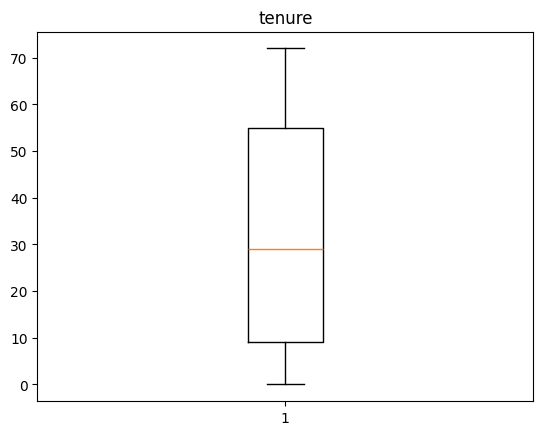

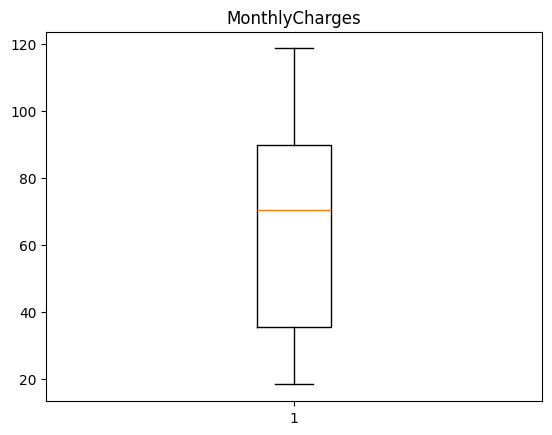

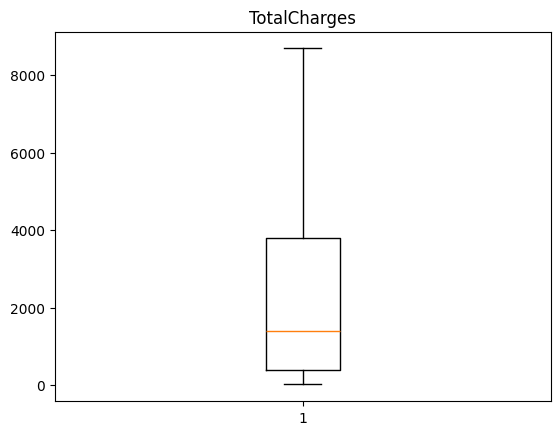

In [60]:
for column in ['tenure', 'MonthlyCharges', 'TotalCharges']:
    plt.boxplot(df[column])
    plt.title(column)
    plt.show()

**Notes**
- **tenure, MonthlyCharges, TotalCharges**: the three numerical columns that maybe contain outliers.
- Some rows in **TotalCharges** column had contained space string " ", So firstly theses values " " was replaced by numbers to can convert the column datatype into float, So the outliers detection is valid.
- So far, I have chosen the minimum value to replace " " in **TotalCharges** which is the corresponding value in **MonthlyCharges**.

##### **Skewness**

**Skewness Detection**
1. Observational Method: 
    - Using Graphs -> such as i did (distplot)
2. Statistical Methods: 
    - Using Formula -> skewness = (3 * (Mean - Median)) / Standard Deviation
    - Pandas **skew()** function for calculating skewness for each column.
        - 1 or more -> Highly Left Skewness.
        - -1 or more -> Hoghly Right Skewness.
        - 0 -> No Skewness

In [61]:
df[['tenure', 'MonthlyCharges', 'TotalCharges']].skew()

tenure            0.239540
MonthlyCharges   -0.220524
TotalCharges      0.963316
dtype: float64

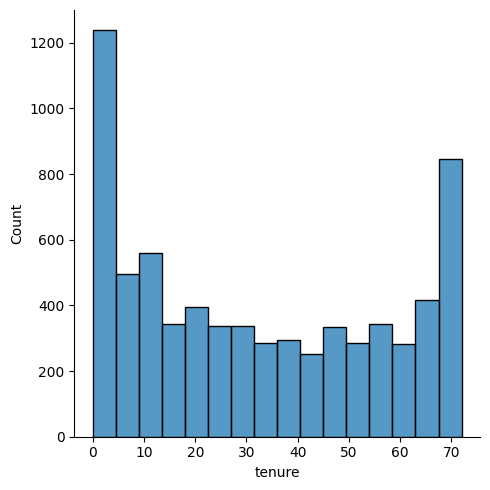

In [62]:
sns.displot(df.tenure)

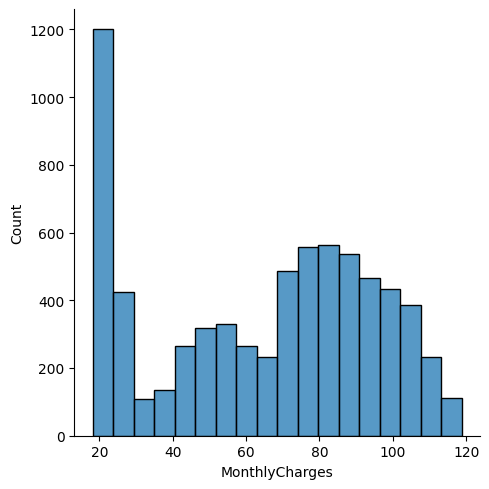

In [63]:
sns.displot(df.MonthlyCharges)

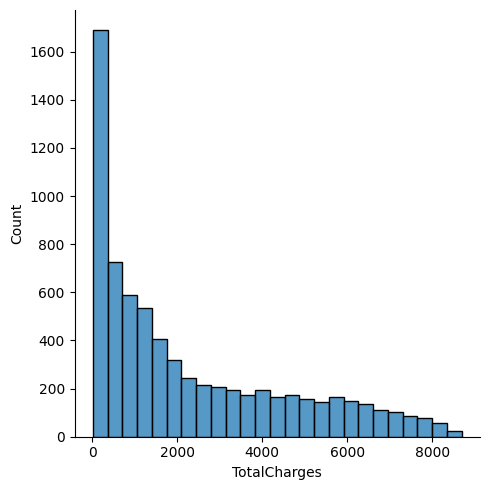

In [64]:
sns.displot(df.TotalCharges)

##### **Imbalanced Data**

In [65]:
df.Churn.value_counts()

Churn
No     5174
Yes    1869
Name: count, dtype: int64

<Axes: xlabel='Churn'>

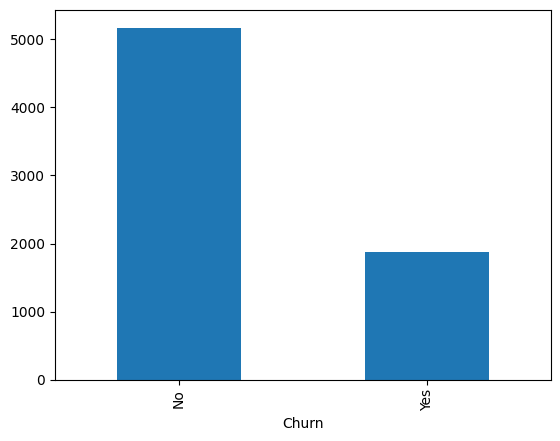

In [66]:
df.Churn.value_counts().plot(kind='bar')

### **Investigation Notes**
- **Unimportant Features**: Remove unimportant features like ID
- **Data Types**: Only **TotalCharges** column datatype should be converted from object into float.
- **Columns Values**: Categorial columns must be encoded into numerical
- **Missing Values**: No missing values, but can treat the " " values in TotalCharges column as a missing values
- **Duplicates**: No duplicates
- **Outliers**: No Outliers
- **Skewness**: **TotalCharges** and **MonthlyCharges** columns are skewed
- **Imbalanced Data**: Data is imbalanced

## **<a id='process'>Data Preprocessing</a>**

##### **Unimportant Features**

In [67]:
df = df.drop(columns=['customerID'])

In [68]:
df.head(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No


##### **Data Types**

- To convert **TotalCharges** datatype into float, firstly it's must to replace " " values, which can be treated as missing values.

**Missing Values Handling**
  - Deletion.
    1. Pairwise Delection: when values are missing completely at random (MCAR). -> only the missing values are deleted.
    2. Listwise Deletion/ Dropping Rows: MCAR also -> complete rows the contain themissing values are deleted.
    3. Dropping Complete Columns: when nulls are about 80% or more and the feature isn't important.

  - Imputation for Non Time Series Data.
    1. Using Constant.
    2. Using Statistics: Mean, Median, Mode
      - **SimpleImputer()**: class in sklearn with above options
    
  - Imputation for Time Series Data.
    1. 'ffill' or 'pad': Replace nulls with last observed values.
    2. 'bfill' or 'backfill': Replace nulls with next obseved values.
    - **fillna()**: function in pandas with above options for parameter **method**.
    3. Linear Interpolation Method: technique that assumes linear relationship among data points and utilises non-missing values from adjacent data points to compute a value for a minssing data point.
    - **interpolate()**: function in pandas.

  - Advanced Imputation Techniques.
    - Using ML Algorithms to impute missing values.
    1. Nearest Neighbors Imputation: Use **KNNImputer()**: Class in **sklearn.impute**
    2. Multivariante Imputation by Chained Equations

  - Algorithms Handle Missing Values without Any Preprocessing.
    1. XGBoost
    2. LightGBm

**Notes**
- I have selected imputation using constant (corresponding value in **MonthlyCharges**) to handle the missing values.
- Because for sure the value that should be instead of " " in **TotalCharges** is corresponding value in **MonthlyCharges** as minimum or more.
- So I will adopt what I handled in dataframe **df**

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   object 
 6   MultipleLines     7043 non-null   object 
 7   InternetService   7043 non-null   object 
 8   OnlineSecurity    7043 non-null   object 
 9   OnlineBackup      7043 non-null   object 
 10  DeviceProtection  7043 non-null   object 
 11  TechSupport       7043 non-null   object 
 12  StreamingTV       7043 non-null   object 
 13  StreamingMovies   7043 non-null   object 
 14  Contract          7043 non-null   object 
 15  PaperlessBilling  7043 non-null   object 
 16  PaymentMethod     7043 non-null   object 


##### **Column Values**

- Categorial columns must be encoded like: 
    - gender, Partner, Dependents, PhoneService, MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaperlessBilling, PaymentMethod, Churn

- Encoding Techniques

    - **Label Encoding**
        - Applied to columns with exactly two unique values (binary columns).
        - Converts categories into numerical values (0 and 1).
        - Binary columns:
            - `gender`
            - `Partner`
            - `Dependents`
            - `PhoneService`
            - `PaperlessBilling`
            - `Churn`
        - Ordinal Columns:
            - `Contract`
            
    - **One-Hot Encoding**
        - Applied to columns with more than two unique values (non-binary columns).
        - Converts each category into separate binary columns.
        - `drop='first'` to avoid the dummy variable trap.
        - Non-binary columns:
            - `MultipleLines`
            - `OnlineSecurity`
            - `OnlineBackup`
            - `DeviceProtection`
            - `TechSupport`
            - `StreamingTV`
            - `StreamingMovies`
            - `InternetService`
            - `PaymentMethod`

In [70]:
categorical_columns = [
    'gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines', 'InternetService',
    'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
    'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn'
]

In [71]:
for col in categorical_columns:
    print(col, ": ", df[col].unique())

gender :  ['Female' 'Male']
Partner :  ['Yes' 'No']
Dependents :  ['No' 'Yes']
PhoneService :  ['No' 'Yes']
MultipleLines :  ['No phone service' 'No' 'Yes']
InternetService :  ['DSL' 'Fiber optic' 'No']
OnlineSecurity :  ['No' 'Yes' 'No internet service']
OnlineBackup :  ['Yes' 'No' 'No internet service']
DeviceProtection :  ['No' 'Yes' 'No internet service']
TechSupport :  ['No' 'Yes' 'No internet service']
StreamingTV :  ['No' 'Yes' 'No internet service']
StreamingMovies :  ['No' 'Yes' 'No internet service']
Contract :  ['Month-to-month' 'One year' 'Two year']
PaperlessBilling :  ['Yes' 'No']
PaymentMethod :  ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
Churn :  ['No' 'Yes']


In [72]:
df[['PhoneService', 'MultipleLines']][df.PhoneService == 'No']

,PhoneService,MultipleLines
0,No,No phone service
3,No,No phone service
7,No,No phone service
20,No,No phone service
27,No,No phone service
...,...,...
7003,No,No phone service
7007,No,No phone service
7029,No,No phone service
7036,No,No phone service


In [73]:
df.PhoneService[df.PhoneService == 'No'].unique()

array(['No'], dtype=object)

In [74]:
df.PhoneService[df.MultipleLines == 'No phone service'].unique()

array(['No'], dtype=object)

#### **Feature Selection Step (#1)**
- **PhoneService** column carries the same information that exists in **MultipleLines** column (When value equals **"No phone service"**)
- So, I will remove a **PhoneService Column**.

In [75]:
df = df.drop(columns='PhoneService')

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   object 
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   object 
 3   Dependents        7043 non-null   object 
 4   tenure            7043 non-null   int64  
 5   MultipleLines     7043 non-null   object 
 6   InternetService   7043 non-null   object 
 7   OnlineSecurity    7043 non-null   object 
 8   OnlineBackup      7043 non-null   object 
 9   DeviceProtection  7043 non-null   object 
 10  TechSupport       7043 non-null   object 
 11  StreamingTV       7043 non-null   object 
 12  StreamingMovies   7043 non-null   object 
 13  Contract          7043 non-null   object 
 14  PaperlessBilling  7043 non-null   object 
 15  PaymentMethod     7043 non-null   object 
 16  MonthlyCharges    7043 non-null   float64


In [77]:
binary_columns = [
    'Partner', 'Dependents',
    'PaperlessBilling', 'Churn'
]

semi_binary_columns = [
    'OnlineSecurity', 'OnlineBackup', 
    'DeviceProtection', 'TechSupport', 
    'StreamingTV', 'StreamingMovies'
]

ordinal_coulmns = [
    'Contract'
]

ohe_columns = [
    'MultipleLines', 'InternetService', 'PaymentMethod'
]

In [78]:
len(df['Churn'].unique())

2

In [79]:
def encode(column):
    if len(df[column].unique()) == 2:
        df[column] = df[column].replace({'No': 0, 'Yes': 1})
    else:
        df[column] = df[column].replace({'No': 0, 'No internet service': 0, 'Yes': 1})
    df[column] = df[column].astype(int)

In [81]:
df.gender = df.gender.replace({'Female': 0, 'Male': 1})

for col in binary_columns:
    encode(col)

for col in semi_binary_columns:
    encode(col)

In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   int64  
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   int32  
 3   Dependents        7043 non-null   int32  
 4   tenure            7043 non-null   int64  
 5   MultipleLines     7043 non-null   object 
 6   InternetService   7043 non-null   object 
 7   OnlineSecurity    7043 non-null   int32  
 8   OnlineBackup      7043 non-null   int32  
 9   DeviceProtection  7043 non-null   int32  
 10  TechSupport       7043 non-null   int32  
 11  StreamingTV       7043 non-null   int32  
 12  StreamingMovies   7043 non-null   int32  
 13  Contract          7043 non-null   object 
 14  PaperlessBilling  7043 non-null   int32  
 15  PaymentMethod     7043 non-null   object 
 16  MonthlyCharges    7043 non-null   float64


In [83]:
df.head(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,No phone service,DSL,0,1,0,0,0,0,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,No,DSL,1,0,1,0,0,0,One year,0,Mailed check,56.95,1889.50,0


In [85]:
df['Contract'] = df['Contract'].replace({'Month-to-month': 1, 'One year': 12, 'Two year': 24})
df['Contract'] = df['Contract'].astype(int)

In [86]:
ohe = OneHotEncoder(drop='first', sparse_output=False)
encoded_data = ohe.fit_transform(df[ohe_columns])

encoded_columns = ohe.get_feature_names_out(ohe_columns)

encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns)
df_encoded = pd.concat([df.drop(columns=ohe_columns), encoded_df], axis=1)


In [87]:
df_encoded.head(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,...,MonthlyCharges,TotalCharges,Churn,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,0,0,0,...,29.85,29.85,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,0,0,0,34,1,0,1,0,0,...,56.95,1889.50,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


##### **Missing Values**
- Already i handled it in Data Types To can convert from object to float. 

##### **Duplicates**
- No Duplicates

##### **Outliers**
- No Outliers

##### **Skewness**
- Function Transformation
    1. Log Transformation
        - Not applied to those features wi negative values.
        - Right-skewed data.
    2. Reciprocal
        - Not defined for zero.
    3. Square
        - Applies to left-skewed data.
    4. Square Root
        - Only for positive numbers.
        - Weaker than Log Transformation.
        - Reducing the skewness of right-skewed data.
- Power Transformation
    1. Box-Cox
        - Data should be positive(not even zero is acceptable).
        - Sqrt - Log
    2. Yeo-Johnson
        - Data have zeroes or negative value.
- Quantile transformation

**Note:**
- I will prefer firstly to apply the clustering algorithms and visualize the clusters and then handle the skewness.

#### Note:
- Return after using Kmeans and T-SNE to visualize the data.
- The **TotalCharges** Column is right skewed and **MonthlyCharges** also, So I will use Transformation that handle right skewness data like **Log Transformation**.

In [88]:
df_log = df_encoded.copy()
df_log.TotalCharges = np.log(df_log.TotalCharges + 1)
df_log.MonthlyCharges = np.log(df_log.MonthlyCharges + 1)
df_log.tenure = np.log(df_log.tenure + 1)
df_log.Contract = np.log(df_log.Contract + 1)

In [89]:
print("Before Log Transformation", f": [{np.min(df_encoded.TotalCharges)}, {np.max(df_encoded.TotalCharges)}]")
print("After Log Transformation", f": [{np.min(df_log.TotalCharges)}, {np.max(df_log.TotalCharges)}]")

Before Log Transformation : [18.8, 8684.8]
After Log Transformation : [2.9856819377004897, 9.069444787271305]


In [90]:
print("Before Log Transformation", f": [{np.min(df_encoded.MonthlyCharges)}, {np.max(df_encoded.MonthlyCharges)}]")
print("After Log Transformation", f": [{np.min(df_log.MonthlyCharges)}, {np.max(df_log.MonthlyCharges)}]")

Before Log Transformation : [18.25, 118.75]
After Log Transformation : [2.9575110607337933, 4.785406236291025]


In [92]:
df_log.to_csv("Telecom_Customers_Churn_Processed_Log.csv", index=False)

In [ ]:
df_encoded.TotalCharges = np.sqrt(df_encoded.TotalCharges)
df_encoded.TotalCharges = np.cbrt(df_encoded.TotalCharges)
df_encoded.TotalCharges = 1 / (df_encoded.TotalCharges)
df_encoded.TotalCharges = stats.boxcox(df_encoded.TotalCharges)

In [ ]:
df_encoded.TotalCharges = np.cbrt(df_encoded.TotalCharges)
df_encoded.to_csv("Telecom_Customers_Churn_Processed_Cbrt.csv", index=False)

In [ ]:
df_encoded.TotalCharges = 1 / (df_encoded.TotalCharges)
df_encoded.to_csv("Telecom_Customers_Churn_Processed_Reciprocal.csv", index=False)

In [ ]:
df_encoded.TotalCharges = stats.boxcox(df_encoded.TotalCharges)
df_encoded.to_csv("Telecom_Customers_Churn_Processed_Boxcox.csv", index=False)

**Note**
- **Because I want to try different types of transformation, i will try all these ones and visualize the result using T-SNE in Model Notebook to can compare among them.**

##### **Imbalanced Data**

1. **Resampling Techniques**

   - **Oversampling Minority Class**: 
      - **Random Over-sampling**: which makes random duplicates.
      - **SMOTE (Synthetic Minority Over-sampling Technique)**: which generates synthetic samples for the minority class.
      - **ADASYN (Adaptive Synthetic Sampling)**: generate synthetic samples for the minority class to balance the dataset.

   - **Undersampling Majority Class**: 
      - **Random Under-sampling**: which remove random points or instances.
      - **NearMiss**: This is a method that selects examples from the majority class that have the smallest average distance to the three closest instances from the minority class.
      - **Tomek Links**: This method removes majority instances that are close to minority instances, aiming to increase the space between the two classes to improve classification.
      - **Cluster Centroids**: This method replaces clusters of majority instances with the cluster centroids, essentially creating synthetic examples.

   - **Hybrid Methods**: 
      - Combining both oversampling the minority class and undersampling the majority class to maintain balance without losing much information (e.g., **SMOTE + Tomek links**).

2. **Algorithmic Techniques**
   - **Cost-Sensitive Learning**: Many algorithms can be made cost-sensitive, where misclassification penalties for the minority class are increased. This ensures that the model pays more attention to the minority class.
   - **Class Weighting**: In algorithms like SVM, Random Forest, or Neural Networks, you can assign different weights to different classes, giving more weight to the minority class.

3. **Anomaly Detection**
   - In cases where the imbalance is extreme (like fraud detection), you can treat the problem as an anomaly detection task, where the minority class represents rare events.

4. **Ensemble Methods**
   - **Bagging and Boosting**: Techniques like **Random Forest** (bagging) or **XGBoost** (boosting) can be used, as these methods combine multiple models to reduce variance and handle imbalanced data effectively.
   - **Balanced Random Forest**: A variant of the Random Forest where each tree is trained on a balanced subset of the data (by undersampling the majority class).

5. **Evaluation Metrics**
   - When dealing with imbalanced data, using standard metrics like **accuracy** can be misleading. Instead, focus on:
     - **Precision, Recall, F1-Score**: These metrics focus on performance for the minority class.
     - **ROC-AUC**: Measures how well the model distinguishes between classes.
     - **Precision-Recall AUC**: More informative than ROC-AUC when dealing with imbalanced datasets.

6. **Synthetic Data Generation**
   - In some scenarios, generating synthetic data using techniques like **GANs (Generative Adversarial Networks)** could help improve the balance and diversity of the dataset, though this can be more complex to implement.

**Note:**
- As a clustering problem, I will prefer not to handle the imbalancing data.
- As a classification problem, It's must to handle it. And i prefer one of those:
    1. **Hybrid Methods** 
    2. **Ensemle Methods**

#### **Saving Processed Data**

In [197]:
df_encoded.to_csv("Telecom_Customers_Churn_Processed.csv", index=False)

## **<a id='analysis'>Exploratory Data Analysis (EDA)</a>**

In [200]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   gender                                 7043 non-null   object 
 1   SeniorCitizen                          7043 non-null   int64  
 2   Partner                                7043 non-null   int32  
 3   Dependents                             7043 non-null   int32  
 4   tenure                                 7043 non-null   int64  
 5   OnlineSecurity                         7043 non-null   int32  
 6   OnlineBackup                           7043 non-null   int32  
 7   DeviceProtection                       7043 non-null   int32  
 8   TechSupport                            7043 non-null   int32  
 9   StreamingTV                            7043 non-null   int32  
 10  StreamingMovies                        7043 non-null   int32  
 11  Pape

In [201]:
corr = df_encoded.corr()

In [202]:
df_encoded.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'PaperlessBilling', 'MonthlyCharges',
       'TotalCharges', 'Churn', 'MultipleLines_No phone service',
       'MultipleLines_Yes', 'InternetService_Fiber optic',
       'InternetService_No', 'Contract_One year', 'Contract_Two year',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check'],
      dtype='object')

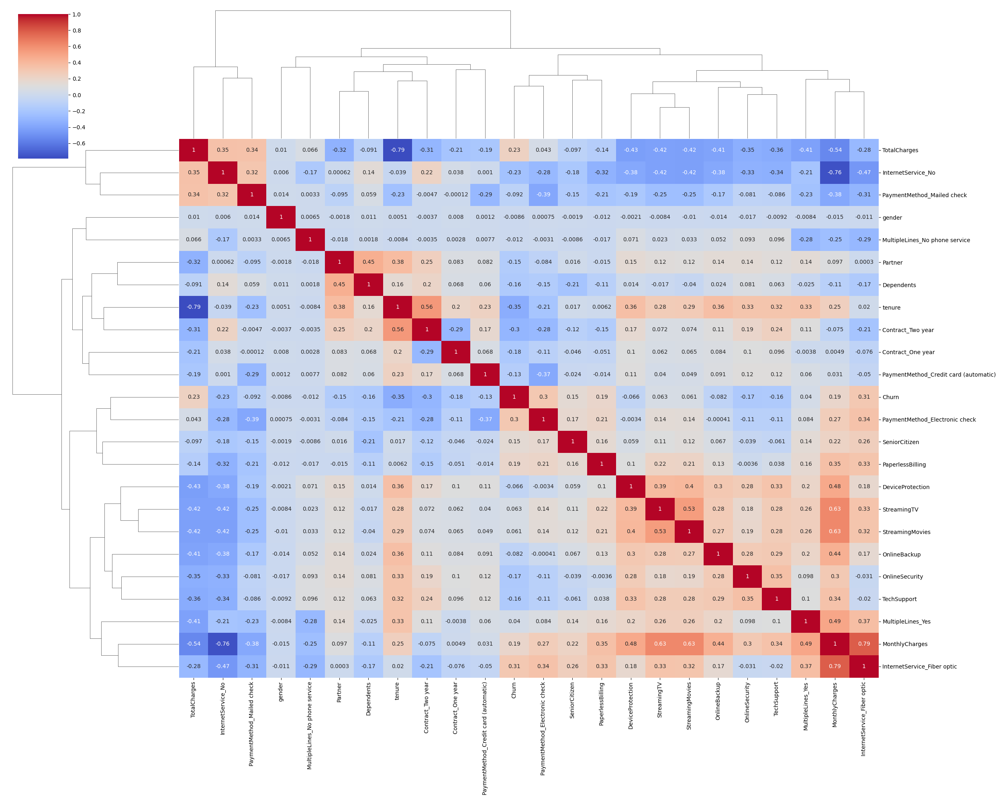

In [203]:
sns.clustermap(corr, annot=True, figsize=(25, 20), cmap="coolwarm")
plt.show()

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

In [4]:
data = pd.read_csv('Data/Telecom Customers Churn.csv').drop('customerID', axis=1)
data.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [5]:
fig = go.Figure()
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Electronic check']['MonthlyCharges'], name='Electronic check', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Mailed check']['MonthlyCharges'], name='Mailed check', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Bank transfer (automatic)']['MonthlyCharges'], name='Bank transfer (automatic)', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Credit card (automatic)']['MonthlyCharges'], name='Credit card (automatic)', boxmean=True))
fig.update_layout(title='Monthly Charges by Payment Method', yaxis_title='Monthly Charges', xaxis_title='Internet Service', boxmode='group')
fig.show()

In [6]:
data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')

fig = go.Figure()
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Electronic check']['TotalCharges'], name='Electronic check', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Mailed check']['TotalCharges'], name='Mailed check', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Bank transfer (automatic)']['TotalCharges'], name='Bank transfer (automatic)', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Credit card (automatic)']['TotalCharges'], name='Credit card (automatic)', boxmean=True))
fig.update_layout(title='Total Charges by Payment Method', yaxis_title='Total Charges', xaxis_title='Internet Service', boxmode='group')
fig.show()

In [7]:
fig = go.Figure()
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Electronic check']['tenure'], name='Electronic check', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Mailed check']['tenure'], name='Mailed check', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Bank transfer (automatic)']['tenure'], name='Bank transfer (automatic)', boxmean=True))
fig.add_trace(go.Box(x=data['InternetService'], y=data[data['PaymentMethod']=='Credit card (automatic)']['tenure'], name='Credit card (automatic)', boxmean=True))
fig.update_layout(title='Tenure by Payment Method', yaxis_title='Tenure', xaxis_title='Internet Service', boxmode='group')
fig.show()

In [8]:
data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')
fig = px.scatter(data, x='tenure', y='MonthlyCharges', color='TotalCharges')
fig.update_layout(title='Tenure vs Monthly Charges', xaxis_title='Tenure', yaxis_title='Monthly Charges')
fig.show()

In [9]:
fig = px.scatter_matrix(data, dimensions=['tenure', 'MonthlyCharges', 'TotalCharges'], color='Churn', color_discrete_sequence=['red', '#00FE30'])
fig.update_layout(title='Scatter Matrix of Tenure, Monthly Charges, and Total Charges')
fig.show()

In [10]:
grouped_data = data.groupby(['Contract','tenure'])[['MonthlyCharges','TotalCharges']].mean().reset_index()
grouped_data.head()

,Contract,tenure,MonthlyCharges,TotalCharges
0,Month-to-month,1,50.841308,50.841308
1,Month-to-month,2,58.326304,116.647826
2,Month-to-month,3,59.242932,178.113613
3,Month-to-month,4,59.331515,237.877879
4,Month-to-month,5,62.209766,310.616406


In [11]:
fig = px.line(grouped_data, x='tenure', y='TotalCharges', color='Contract')
fig.update_layout(title='Total Charges by Tenure and Contract', xaxis_title='Tenure', yaxis_title='Total Charges')
fig.show()

In [12]:
from plotly.subplots import make_subplots

# Create subplots
fig = make_subplots(rows=1, cols=4, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])

# Add pie charts to subplots with a hole
fig.add_trace(go.Pie(labels=data['InternetService'].unique(), values=data[data['PaymentMethod']=='Electronic check']['InternetService'].value_counts(), name='Electronic check', title='E check'), row=1, col=1)
fig.add_trace(go.Pie(labels=data['InternetService'].unique(), values=data[data['PaymentMethod']=='Mailed check']['InternetService'].value_counts(), name='Mailed check', title='Mailed check'), row=1, col=2)
fig.add_trace(go.Pie(labels=data['InternetService'].unique(), values=data[data['PaymentMethod']=='Bank transfer (automatic)']['InternetService'].value_counts(), name='Bank transfer (automatic)', title='Bank transfer'), row=1, col=3)
fig.add_trace(go.Pie(labels=data['InternetService'].unique(), values=data[data['PaymentMethod']=='Credit card (automatic)']['InternetService'].value_counts(), name='Credit card (automatic)', title='Credit card'), row=1, col=4)

# Update layout
fig.update_traces(hole=0.4)
fig.update_layout(title_text='Payment Method by Internet Service', showlegend=True, title_x=0.5)

# Show figure
fig.show()


In [13]:
fig = px.histogram(data, x="Churn", color='gender', barmode='group', color_discrete_sequence=['pink', 'blue'])
fig.update_layout(title='Churn by Gender', xaxis_title='Gender', yaxis_title='Count')
fig.show()

## **<a id='super'>Supervisted ML Models</a>**
- **Classification**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import mean_squared_error, r2_score, roc_auc_score, roc_curve, confusion_matrix, classification_report, accuracy_score

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/telecom_churn_processed4modeling.csv")
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,-1,1,0,1,0,0,0,0,1,1,1,29.85,29.85,0
1,1,0,0,0,34,1,0,1,1,0,1,0,0,0,12,0,2,56.95,1889.5,0
2,1,0,0,0,2,1,0,1,1,1,0,0,0,0,1,1,2,53.85,108.15,1
3,1,0,0,0,45,0,-1,1,1,0,1,1,0,0,12,0,3,42.30,1840.75,0
4,0,0,0,0,2,1,0,2,0,0,0,0,0,0,1,1,1,70.70,151.65,1


In [4]:
# Convert 'TotalCharges' column to numeric, handling errors
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')

# Drop rows with missing values in 'TotalCharges'
df.dropna(subset=['TotalCharges'], inplace=True)

X = df.drop(["Churn"], axis=1)
y = df["Churn"]

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

In [6]:
models = {
    "LogisticRegression": LogisticRegression(),
    "LogisticRegressionCV": LogisticRegressionCV(),
    "SVC": SVC(probability=True),
    "DecisionTreeClassifier": DecisionTreeClassifier(),
    "RandomForestClassifier": RandomForestClassifier(),
    "GradientBoostingClassifier": GradientBoostingClassifier(),
    "AdaBoostClassifier": AdaBoostClassifier(),
    "KNeighborsClassifier": KNeighborsClassifier(),
    "XGBClassifier": XGBClassifier(),
    "XGBRFClassifier": XGBRFClassifier(),
    "LGBMClassifier": LGBMClassifier(),
}

In [7]:
import time

cls_results = []
for name, model in models.items():
    start_time = time.time()
    model.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time

    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    loss = mean_squared_error(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    cls_results.append({
        "Model": name,
        "Loss": f"{loss:.3f}",
        "Accuracy": f"{accuracy:.3f}",
        "AUC": f"{roc_auc:.3f}",
        "Time": f"{training_time:.2f} seconds"
    })
cls_results_df = pd.DataFrame(cls_results).sort_values(by="Accuracy", ascending=False)
cls_results_df

[LightGBM] [Info] Number of positive: 1501, number of negative: 4124
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 628
[LightGBM] [Info] Number of data points in the train set: 5625, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.266844 -> initscore=-1.010692
[LightGBM] [Info] Start training from score -1.010692


,Model,Loss,Accuracy,AUC,Time
6,AdaBoostClassifier,0.200,0.800,0.843,0.32 seconds
1,LogisticRegressionCV,0.203,0.797,0.845,4.43 seconds
0,LogisticRegression,0.205,0.795,0.846,0.33 seconds
5,GradientBoostingClassifier,0.212,0.788,0.839,1.22 seconds
9,XGBRFClassifier,0.219,0.781,0.839,0.16 seconds
10,LGBMClassifier,0.220,0.780,0.829,0.13 seconds
4,RandomForestClassifier,0.223,0.777,0.815,1.83 seconds
8,XGBClassifier,0.224,0.776,0.817,0.13 seconds
7,KNeighborsClassifier,0.252,0.748,0.755,0.00 seconds
2,SVC,0.262,0.738,0.809,17.82 seconds


In [8]:
def plot_roc_curve(y_test, y_pred_proba):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc:.3})")
    plt.plot([0, 1], [0, 1], "k--", label="Random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()

In [9]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def display_cm_roc(y_test, y_pred, y_prob):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    # ROC Curve
    plot_roc_curve(y_test, y_prob)
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(ax=ax[0])
    ax[0].set_title('Confusion Matrix')

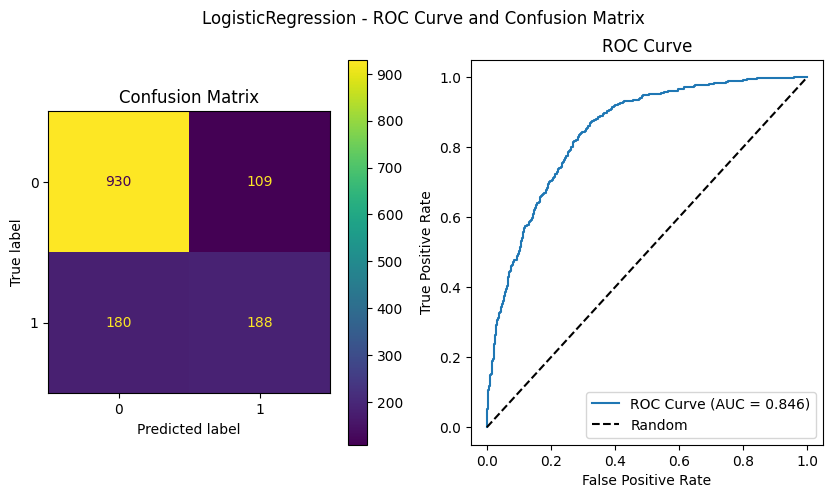

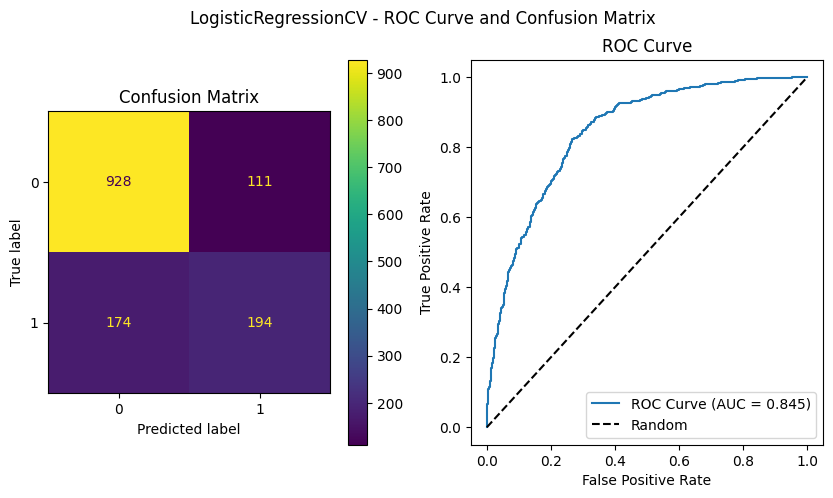

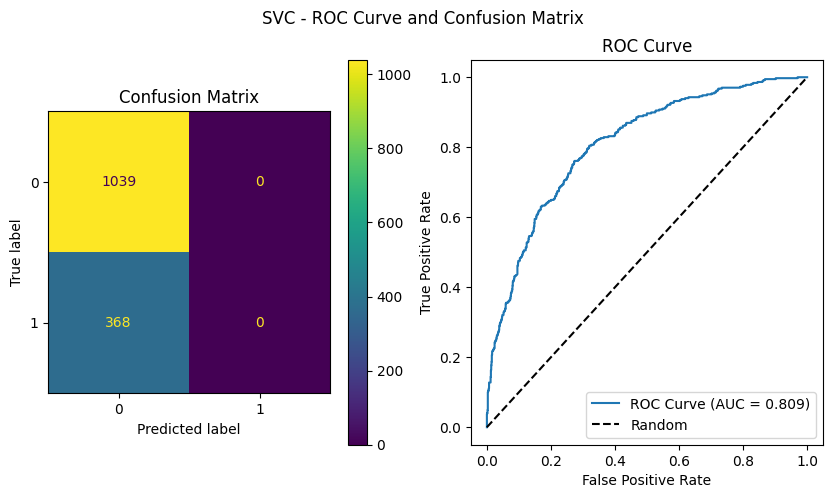

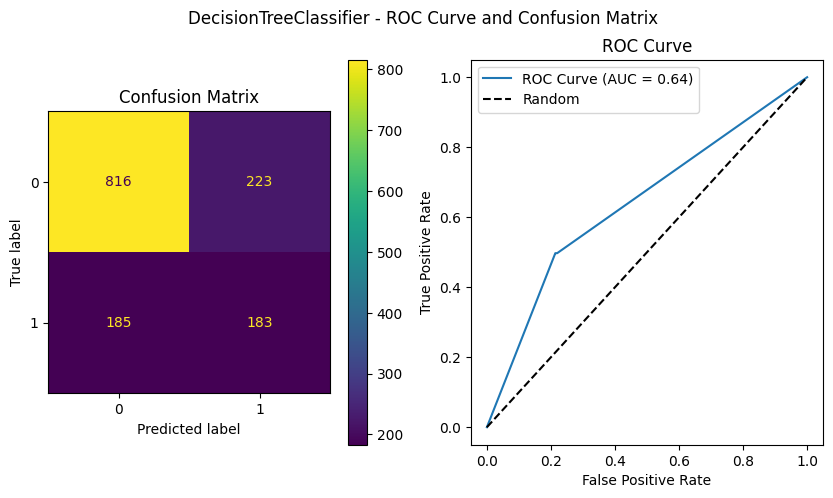

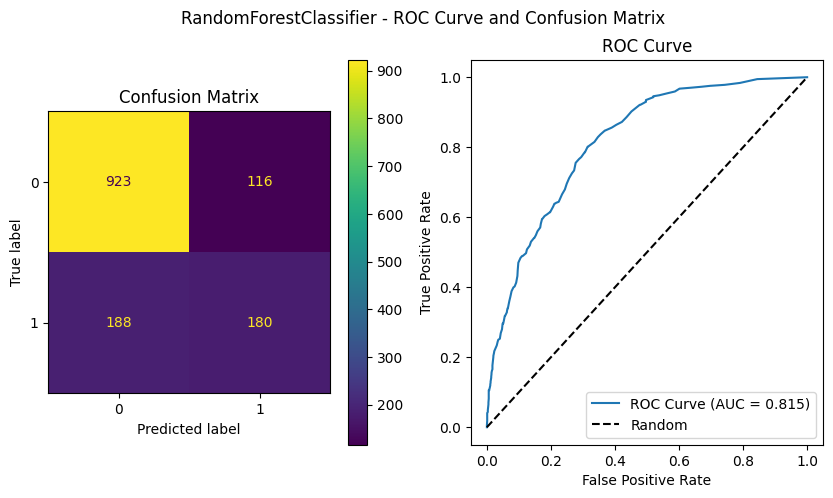

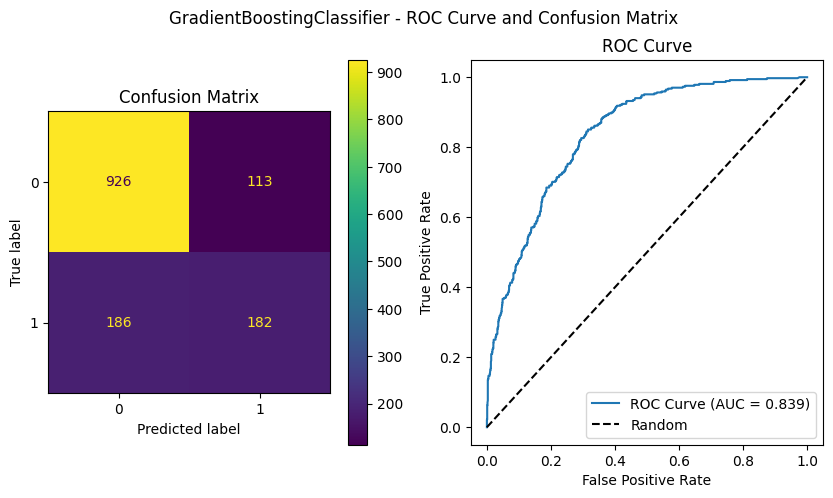

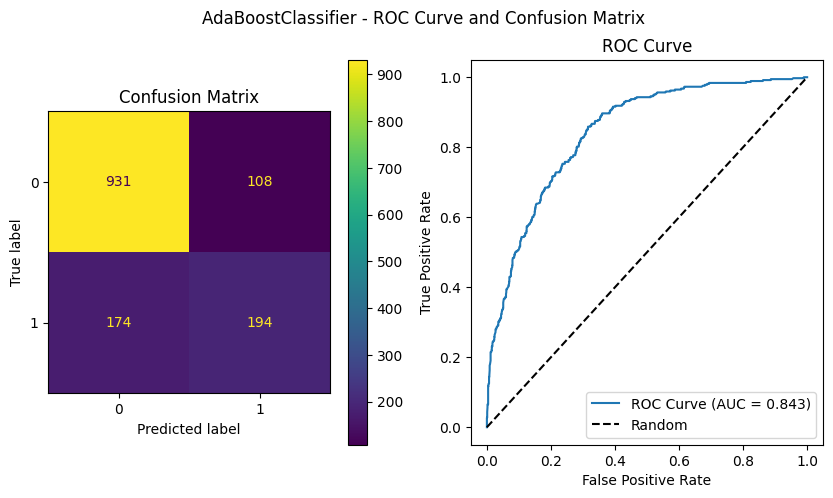

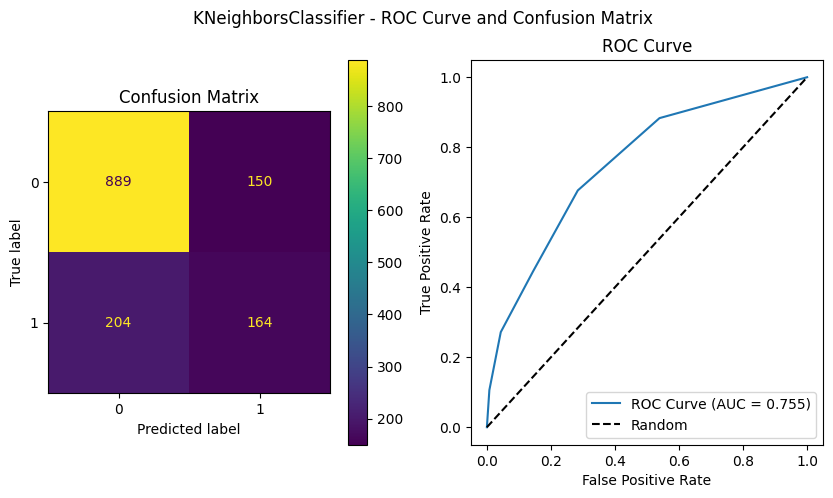

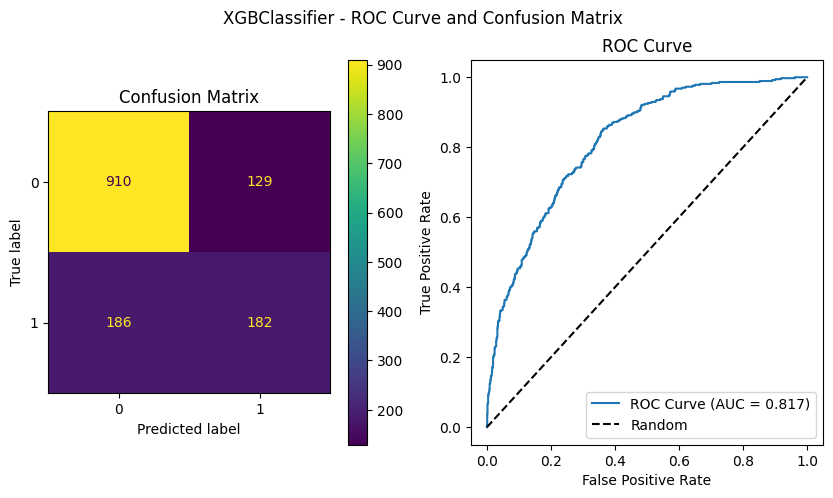

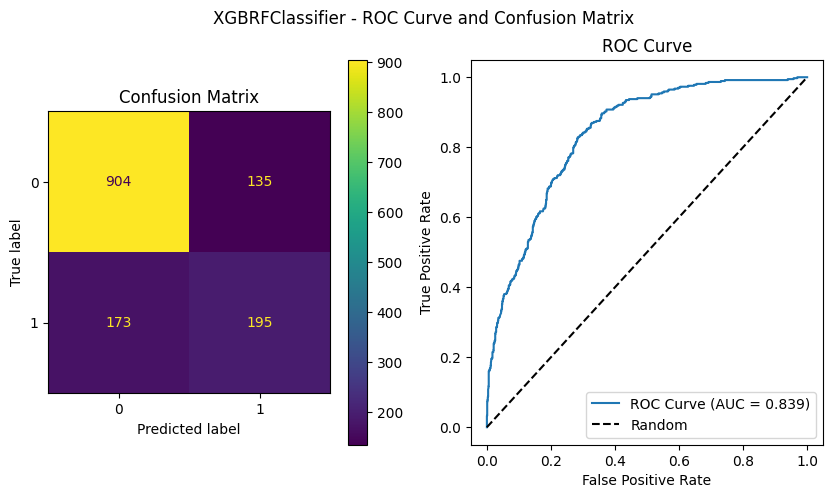

[LightGBM] [Info] Number of positive: 1501, number of negative: 4124
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 628
[LightGBM] [Info] Number of data points in the train set: 5625, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.266844 -> initscore=-1.010692
[LightGBM] [Info] Start training from score -1.010692


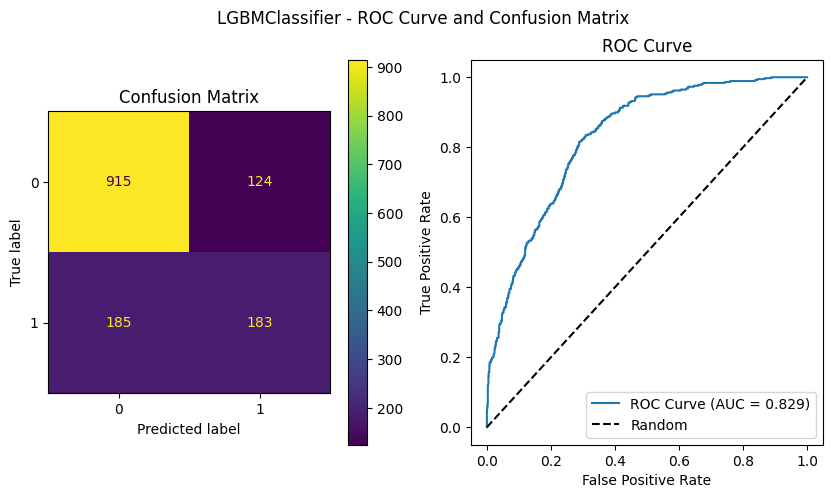

In [15]:
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    display_cm_roc(y_test, y_pred, y_pred_proba)
    plt.suptitle(f"{name} - ROC Curve and Confusion Matrix")
    plt.title(f"ROC Curve")
    plt.show()

- **Regression**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor, LocalOutlierFactor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score, roc_auc_score, roc_curve

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/telecom_churn_processed4modeling.csv")
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,-1,1,0,1,0,0,0,0,1,1,1,29.85,29.85,0
1,1,0,0,0,34,1,0,1,1,0,1,0,0,0,12,0,2,56.95,1889.5,0
2,1,0,0,0,2,1,0,1,1,1,0,0,0,0,1,1,2,53.85,108.15,1
3,1,0,0,0,45,0,-1,1,1,0,1,1,0,0,12,0,3,42.30,1840.75,0
4,0,0,0,0,2,1,0,2,0,0,0,0,0,0,1,1,1,70.70,151.65,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7043 non-null   int64  
 1   SeniorCitizen     7043 non-null   int64  
 2   Partner           7043 non-null   int64  
 3   Dependents        7043 non-null   int64  
 4   tenure            7043 non-null   int64  
 5   PhoneService      7043 non-null   int64  
 6   MultipleLines     7043 non-null   int64  
 7   InternetService   7043 non-null   int64  
 8   OnlineSecurity    7043 non-null   int64  
 9   OnlineBackup      7043 non-null   int64  
 10  DeviceProtection  7043 non-null   int64  
 11  TechSupport       7043 non-null   int64  
 12  StreamingTV       7043 non-null   int64  
 13  StreamingMovies   7043 non-null   int64  
 14  Contract          7043 non-null   int64  
 15  PaperlessBilling  7043 non-null   int64  
 16  PaymentMethod     7043 non-null   int64  


In [ ]:
# Convert 'TotalCharges' column to numeric, handling errors
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')

# Drop rows with missing values in 'TotalCharges'
df.dropna(subset=['TotalCharges'], inplace=True)

In [ ]:
X = df.drop(["TotalCharges", "Churn"], axis=1)
y = df["TotalCharges"]

In [ ]:
df.shape

(7032, 20)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the models and their parameter grids
models = {
    'Linear Regression': {
        'model': LinearRegression(),
        'params': {}
    },
    'Lasso': {
        'model': Lasso(),
        'params': {
            'alpha': [0.1, 0.5, 1.0, 2.0]
        }
    },
    'Ridge': {
        'model': Ridge(),
        'params': {
            'alpha': [0.1, 0.5, 1.0, 2.0]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'kernel': ['linear', 'poly', 'rbf'],
            'C': [0.1, 1, 10]
        }
    },
    'Decision Tree': {
        'model': DecisionTreeRegressor(),
        'params': {
            'max_depth': [3, 5, 7, 10],
            'min_samples_split': [2, 5, 10]
        }
    },
    'Random Forest': {
        'model': RandomForestRegressor(),
        'params': {
            'n_estimators': [100, 200, 300],
            'max_depth': [5, 10, 15]
        }
    },
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.1, 0.5]
        }
    },
    'AdaBoost': {
        'model': AdaBoostRegressor(),
        'params': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 0.5]
        }
    },
    'KNeighbors': {
        'model': KNeighborsRegressor(),
        'params': {
            'n_neighbors': [3, 5, 7],
            'weights': ['uniform', 'distance']
        }
    },
    'XGBoost': {
        'model': XGBRegressor(),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.1, 0.5]
        }
    },
    'LightGBM': {
        'model': LGBMRegressor(),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.1, 0.5]
        }
    }
}

In [ ]:
import time

%time
reg_results = []

for model_name, model_info in models.items():
    model = model_info['model']
    params = model_info['params']

    grid_search = GridSearchCV(model, params, cv=5, scoring='neg_mean_squared_error')
    start_time = time.time()
    grid_search.fit(X_train, y_train)
    end_time = time.time()
    fit_time = end_time - start_time

    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_
    best_model.fit(X_train, y_train)
    y_pred = best_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    reg_results.append({
        'Model': model_name,
        'Best Parameters': best_params,
        'Best Score': f"{best_score:0.2f}",
        'MSE': f"{mse:0.2f}",
        'R2': f"{r2:0.6f}",
        'Fit Time': f"{fit_time:0.2f} sec"
    })

reg_results_df = pd.DataFrame(reg_results).sort_values(by='R2', ascending=False)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.39 µs
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 373
[LightGBM] [Info] Number of data points in the train set: 3937, number of used features: 18
[LightGBM] [Info] Start training from score 2287.749581
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 373
[LightGBM] [Info] Number of data points in the train set: 3937, number of used features: 18
[LightGBM] [Info] Start training from score 2274.688583
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force

In [ ]:
reg_results_df

,Model,Best Parameters,Best Score,MSE,R2,Fit Time
5,Random Forest,"{'max_depth': 10, 'n_estimators': 300}",6714.28,6151.22,0.998854,128.19 sec
10,LightGBM,"{'learning_rate': 0.1, 'n_estimators': 100}",7018.43,6166.46,0.998852,9.55 sec
9,XGBoost,"{'learning_rate': 0.1, 'n_estimators': 100}",6720.85,6183.73,0.998848,14.86 sec
6,Gradient Boosting,"{'learning_rate': 0.1, 'n_estimators': 300}",8346.82,7302.55,0.998640,52.98 sec
8,KNeighbors,"{'n_neighbors': 7, 'weights': 'distance'}",9031.36,8000.56,0.998510,0.90 sec
4,Decision Tree,"{'max_depth': 10, 'min_samples_split': 10}",14364.44,12632.60,0.997647,1.33 sec
7,AdaBoost,"{'learning_rate': 0.5, 'n_estimators': 200}",100476.56,104585.94,0.980521,44.80 sec
3,SVR,"{'C': 10, 'kernel': 'poly'}",128076.94,132573.94,0.975309,75.47 sec
1,Lasso,{'alpha': 0.1},483150.18,506343.12,0.905696,1.79 sec
2,Ridge,{'alpha': 1.0},483148.59,506353.95,0.905694,0.97 sec


In [ ]:
lgbm_model = LGBMRegressor(learning_rate=0.1, n_estimators=100)
lgbm_model.fit(X_train, y_train)
y_pred = lgbm_model.predict(X_test)

testnpred_df = pd.DataFrame({"y_test": y_test, "y_pred": y_pred, "diff": np.abs(y_test - y_pred)})
testnpred_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/Supervised/Results/LightGBM.csv", index=False)
testnpred_df.head(10)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000616 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 373
[LightGBM] [Info] Number of data points in the train set: 4922, number of used features: 18
[LightGBM] [Info] Start training from score 2284.061469


,y_test,y_pred,diff
5974,218.50,192.075285,26.424715
5699,1219.85,1297.540641,77.690641
3369,580.80,648.755542,67.955542
1224,45.85,44.782971,1.067029
3416,837.50,824.927054,12.572946
2448,1531.40,1457.855238,73.544762
2833,4017.45,4061.236783,43.786783
4286,801.30,827.171256,25.871256
5790,2036.55,2105.994163,69.444163
634,2236.20,2232.744059,3.455941


In [ ]:
randf_model = RandomForestRegressor(max_depth=10, n_estimators=300)
randf_model.fit(X_train, y_train)
y_pred = randf_model.predict(X_test)

testnpred_df = pd.DataFrame({"y_test": y_test, "y_pred": y_pred, "diff": np.abs(y_test - y_pred)})
testnpred_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/Supervised/Results/RandomForest.csv", index=False)
testnpred_df.head(10)

,y_test,y_pred,diff
5974,218.50,204.008502,14.491498
5699,1219.85,1344.970255,125.120255
3369,580.80,617.020403,36.220403
1224,45.85,45.470189,0.379811
3416,837.50,855.757306,18.257306
2448,1531.40,1333.588940,197.811060
2833,4017.45,4013.691408,3.758592
4286,801.30,808.112454,6.812454
5790,2036.55,2073.219043,36.669043
634,2236.20,2205.489554,30.710446


In [ ]:
xgb_model = XGBRegressor(learning_rate=0.1, n_estimators=100)
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)

testnpred_df = pd.DataFrame({"y_test": y_test, "y_pred": y_pred, "diff": np.abs(y_test - y_pred)})
testnpred_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/Supervised/Results/XGBoost.csv", index=False)
testnpred_df.head(10)

,y_test,y_pred,diff
5974,218.50,204.784912,13.715088
5699,1219.85,1361.877441,142.027441
3369,580.80,641.382507,60.582507
1224,45.85,47.283894,1.433894
3416,837.50,844.118164,6.618164
2448,1531.40,1440.913940,90.486060
2833,4017.45,4064.537354,47.087354
4286,801.30,824.170471,22.870471
5790,2036.55,2076.887207,40.337207
634,2236.20,2287.261963,51.061963


In [ ]:
gradb_model = GradientBoostingRegressor(learning_rate=0.1, n_estimators=300)
gradb_model.fit(X_train, y_train)
y_pred = gradb_model.predict(X_test)

testnpred_df = pd.DataFrame({"y_test": y_test, "y_pred": y_pred, "diff": np.abs(y_test - y_pred)})
testnpred_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/Supervised/Results/GradientBoosting.csv", index=False)
testnpred_df.head(10)

,y_test,y_pred,diff
5974,218.50,217.590921,0.909079
5699,1219.85,1239.539533,19.689533
3369,580.80,637.046947,56.246947
1224,45.85,39.745595,6.104405
3416,837.50,721.811239,115.688761
2448,1531.40,1446.601262,84.798738
2833,4017.45,4093.600031,76.150031
4286,801.30,825.832804,24.532804
5790,2036.55,2025.336141,11.213859
634,2236.20,2158.469972,77.730028


In [ ]:
knn_model = KNeighborsRegressor(n_neighbors=7, weights='distance')
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test)

testnpred_df = pd.DataFrame({"y_test": y_test, "y_pred": y_pred, "diff": np.abs(y_test - y_pred)})
testnpred_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/Supervised/Results/KNN.csv", index=False)
testnpred_df.head(10)

,y_test,y_pred,diff
5974,218.50,211.693979,6.806021
5699,1219.85,1228.029048,8.179048
3369,580.80,610.309323,29.509323
1224,45.85,45.453132,0.396868
3416,837.50,829.263314,8.236686
2448,1531.40,1440.358980,91.041020
2833,4017.45,3976.546045,40.903955
4286,801.30,802.987869,1.687869
5790,2036.55,2041.424047,4.874047
634,2236.20,2285.357693,49.157693


In [ ]:
tree_model = DecisionTreeRegressor(max_depth=10, min_samples_split=2)
tree_model.fit(X_train, y_train)
y_pred = tree_model.predict(X_test)

testnpred_df = pd.DataFrame({"y_test": y_test, "y_pred": y_pred, "diff": np.abs(y_test - y_pred)})
testnpred_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Internship/Neuronetix/Supervised/Results/DecisionTree.csv", index=False)
testnpred_df.head(10)

,y_test,y_pred,diff
5974,218.50,198.310000,20.190000
5699,1219.85,1386.225000,166.375000
3369,580.80,619.700000,38.900000
1224,45.85,45.546154,0.303846
3416,837.50,879.907692,42.407692
2448,1531.40,1275.350000,256.050000
2833,4017.45,4111.850000,94.400000
4286,801.30,810.580000,9.280000
5790,2036.55,2054.800000,18.250000
634,2236.20,2257.250000,21.050000


In [29]:
import pandas as pd
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.metrics import silhouette_score
import numpy as np
from scipy import stats
import optuna
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import IsolationForest
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score 
from sklearn.metrics import mutual_info_score, adjusted_rand_score
from sklearn.neighbors import NearestNeighbors

## **<a id='unsuper'>Unsupervisted ML Models</a>**
- **Telecom Customer Segmentation**

In [30]:
df = pd.read_csv('../Data Preprocessing/Telecom_Customers_Churn_Processed.csv')

In [31]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,...,MonthlyCharges,TotalCharges,Churn,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,0,0,0,...,29.85,0.567775,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,0,0,0,34,1,0,1,0,0,...,56.95,0.284408,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1,0,0,0,2,1,1,0,0,0,...,53.85,0.458137,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,0,0,0,45,1,0,1,1,0,...,42.30,0.285650,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,0,0,0,2,0,0,0,0,0,...,70.70,0.433038,1,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   gender                                 7043 non-null   int64  
 1   SeniorCitizen                          7043 non-null   int64  
 2   Partner                                7043 non-null   int64  
 3   Dependents                             7043 non-null   int64  
 4   tenure                                 7043 non-null   int64  
 5   OnlineSecurity                         7043 non-null   int64  
 6   OnlineBackup                           7043 non-null   int64  
 7   DeviceProtection                       7043 non-null   int64  
 8   TechSupport                            7043 non-null   int64  
 9   StreamingTV                            7043 non-null   int64  
 10  StreamingMovies                        7043 non-null   int64  
 11  Cont

In [33]:
X = df.drop(columns=['Churn'])
y = df.Churn

### **Finding The Optimal Number of Clusters**
1. **Elbow Method.**
2. **Silhouette Coefficient**.
3. **Dendogram**
4. **T-SNE**

#### **Elbow Method**

2568804.227530351


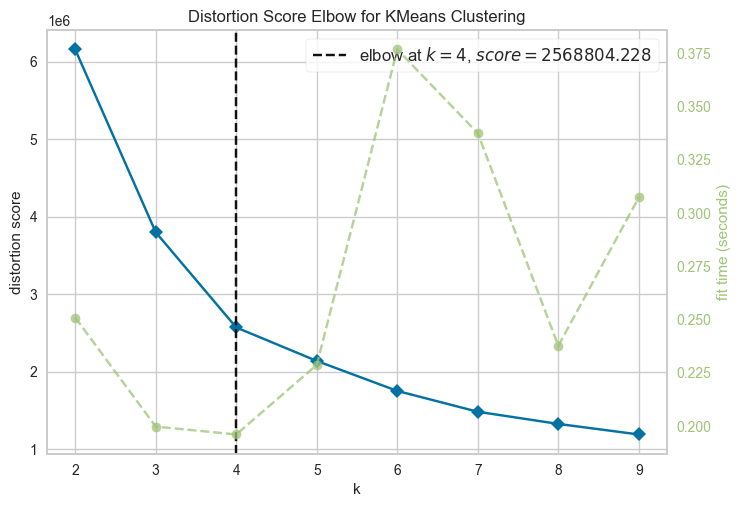

0.4393064994602282


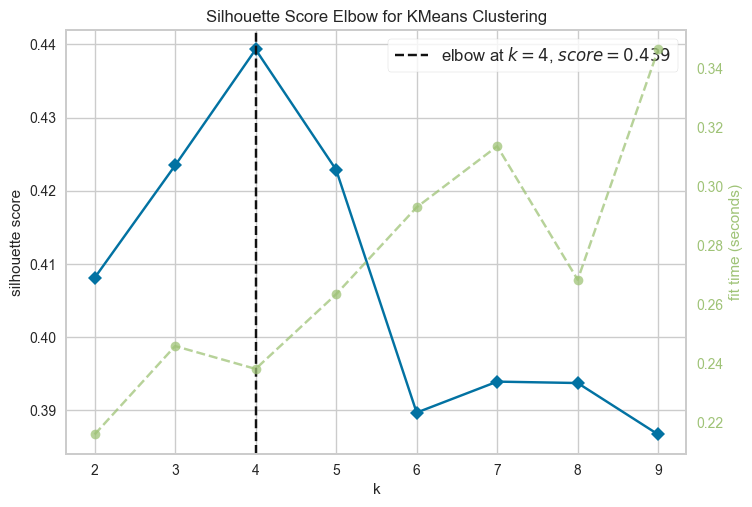

In [34]:
metrics = ['distortion', 'silhouette']
for metric in metrics:
    km = KMeans(random_state=0, n_init=10)
    visualizer = KElbowVisualizer(km, k=(2,10), metric=metric)
    visualizer.fit(X)
    print(visualizer.elbow_score_)
    visualizer.show() 

#### **Silhouette Score**

In [35]:
for i in range(2, 10):
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10)
    visualizer = SilhouetteVisualizer(kmeans)
    visualizer.fit(X)
    print(f"{i} clusters = {visualizer.silhouette_score_}")
plt.close()

2 clusters = 0.4080953980556161
3 clusters = 0.4234587535801153
4 clusters = 0.4393064994602282
5 clusters = 0.4228668183588165
6 clusters = 0.38969136744961586
7 clusters = 0.39392390279263206
8 clusters = 0.39373167694769684
9 clusters = 0.3867026792213703


#### **Dendogram**

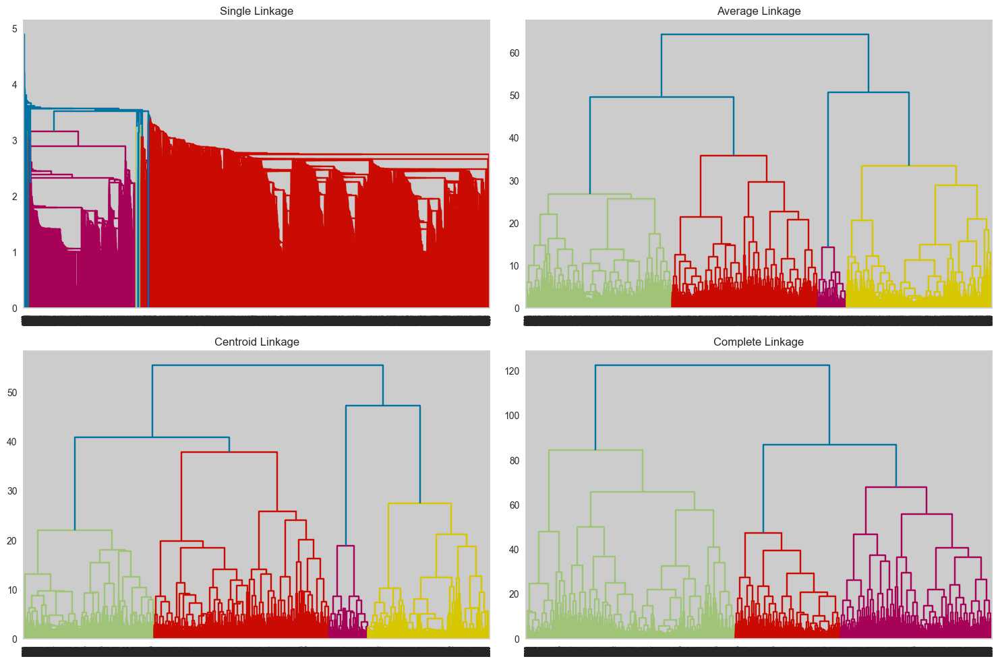

In [79]:
methods = ['single', 'average', 'centroid', 'complete']


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, method in enumerate(methods):
    plt.sca(axes[i])
    plt.title(f"{method.capitalize()} Linkage")
    dend = shc.dendrogram(shc.linkage(df, method=method, metric='euclidean'))

plt.tight_layout()
plt.show()

#### **T-SNE**

In [36]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X))

<Axes: xlabel='0', ylabel='1'>

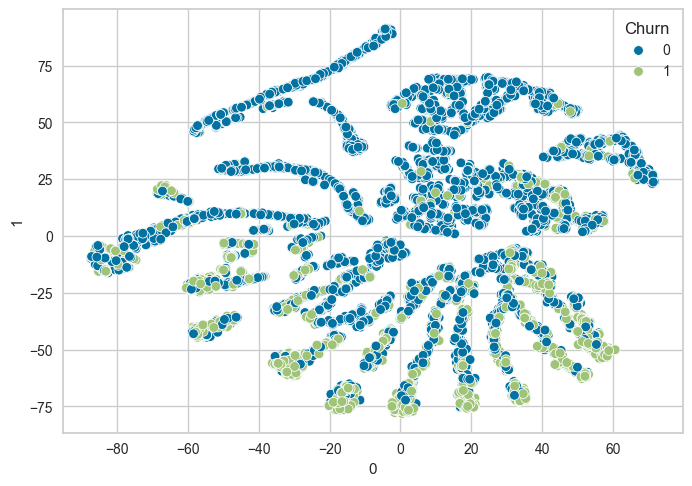

In [37]:
sns.scatterplot(df_tsne, x=0, y=1, hue=y)

### **Evaluation Methods**
1. **T-SNE**
2. **Silhouette Score**

### **1. KMeans**

In [23]:
kmeans = KMeans(n_clusters=4, n_init=10)
kmeans.fit(X)
labels = kmeans.labels_

In [24]:
pd.Series(labels).value_counts()

3    2186
1    1959
0    1745
2    1153
Name: count, dtype: int64

In [25]:
silhouette_score(X, labels)

0.4657094101182724

In [27]:
silhouette = silhouette_score(X, kmeans.labels_) 
db_index = davies_bouldin_score(X, kmeans.labels_) 
ch_index = calinski_harabasz_score(X, kmeans.labels_) 
ari = adjusted_rand_score(y, kmeans.labels_) 
mi = mutual_info_score(y, kmeans.labels_)
print(f"Silhouette Score: {silhouette:.3f}") 
print(f"Davies-Bouldin Index: {db_index:.3f}") 
print(f"Calinski-Harabasz Index: {ch_index:.3f}") 
print(f"Adjusted Rand Index: {ari:.3f}") 
print(f"Mutual Information (MI): {mi:.3f}")

Silhouette Score: 0.466
Davies-Bouldin Index: 0.755
Calinski-Harabasz Index: 9127.183
Adjusted Rand Index: 0.029
Mutual Information (MI): 0.072


In [32]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X))

<Axes: xlabel='0', ylabel='1'>

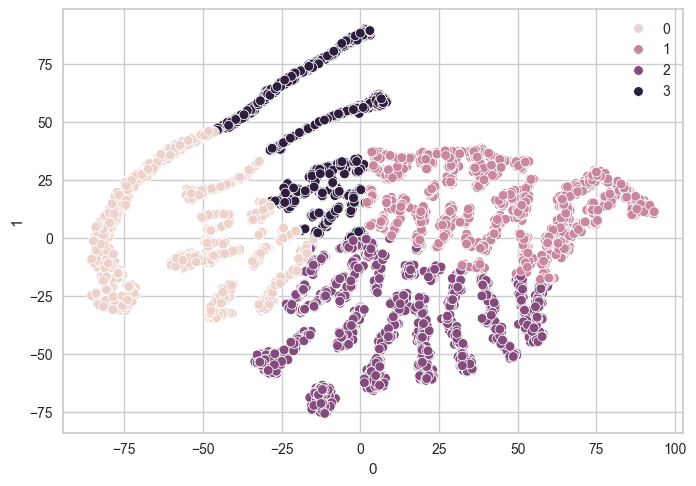

In [33]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

**Note**
- I will return to the preprocessing step to handle the **skewness**, for sure it will inhance the structure of sepreable classes.

In [55]:
df_log = df.copy()
df_sqrt = df.copy()
df_sq = df.copy()
df_cbrt = df.copy()
df_reciprocal = df.copy()
df_boxcox = df.copy()

In [56]:
df_log.TotalCharges = np.log(df_log.TotalCharges + 1)
df_log.MonthlyCharges = np.log(df_log.MonthlyCharges + 1)
df_log.tenure = np.log(df_log.tenure + 1)
df_log.Contract = np.log(df_log.Contract + 1)

df_sqrt.TotalCharges = np.sqrt(df_sqrt.TotalCharges)
df_sqrt.MonthlyCharges = np.sqrt(df_sqrt.MonthlyCharges)
df_sqrt.tenure = np.sqrt(df_sqrt.tenure)
df_sqrt.Contract = np.sqrt(df_sqrt.Contract)

df_sq.TotalCharges = df_sq.TotalCharges ** 2
df_sq.MonthlyCharges = df_sq.MonthlyCharges ** 2
df_sq.tenure = df_sq.tenure ** 2
df_sq.Contract = df_sq.Contract ** 2

df_cbrt.TotalCharges = np.cbrt(df_cbrt.TotalCharges)
df_cbrt.MonthlyCharges = np.cbrt(df_cbrt.MonthlyCharges)
df_cbrt.tenure = np.cbrt(df_log.tenure)
df_cbrt.Contract = np.cbrt(df_log.Contract)

df_reciprocal.TotalCharges = 1 / (df_reciprocal.TotalCharges)
df_reciprocal.MonthlyCharges = 1 / (df_reciprocal.MonthlyCharges)
# df_reciprocal.tenure = 1 / df_reciprocal.tenure

df_boxcox.TotalCharges, _ = stats.boxcox(df_boxcox.TotalCharges)
df_boxcox.MonthlyCharges, _ = stats.boxcox(df_boxcox.MonthlyCharges)
df_boxcox.Contract, _ = stats.boxcox(df_boxcox.Contract)

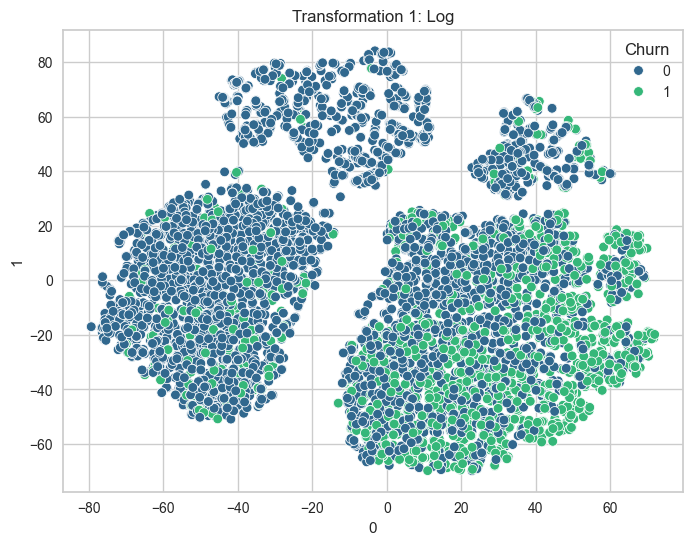

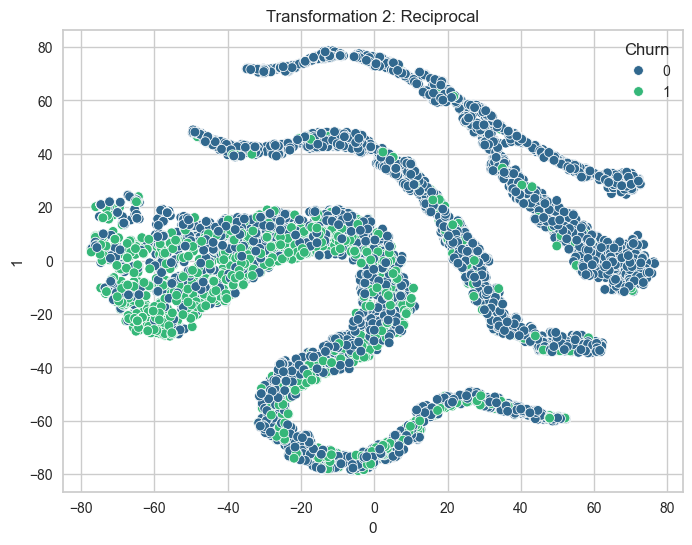

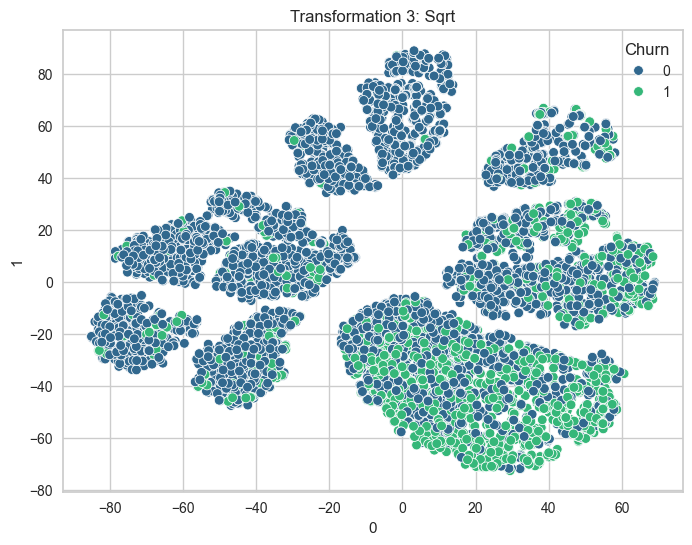

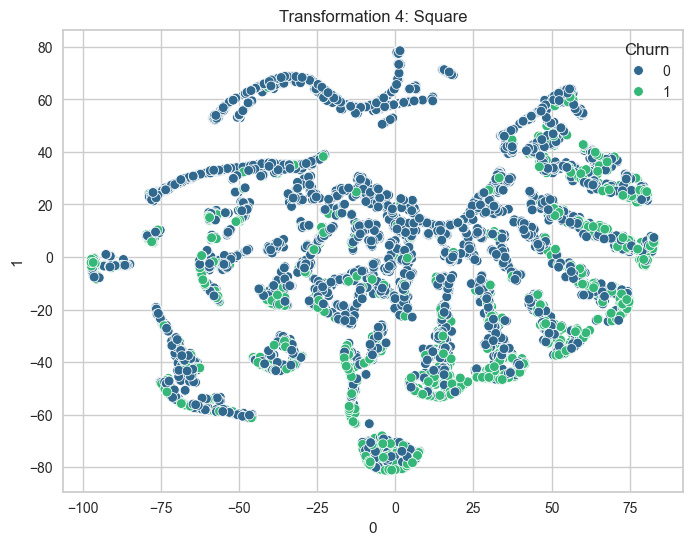

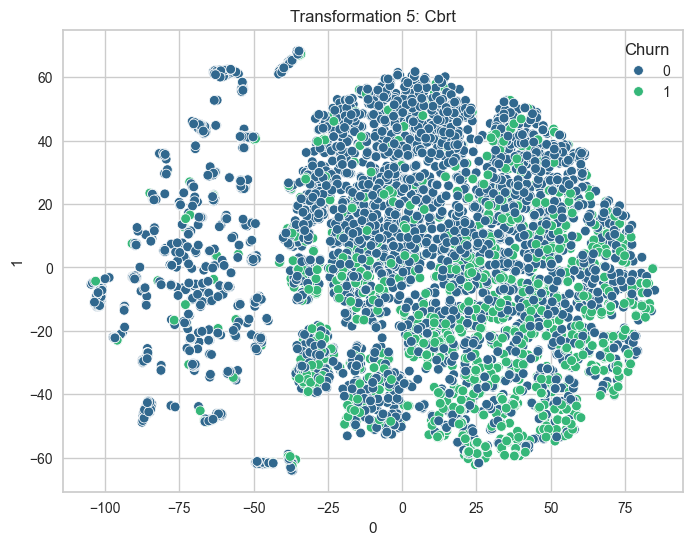

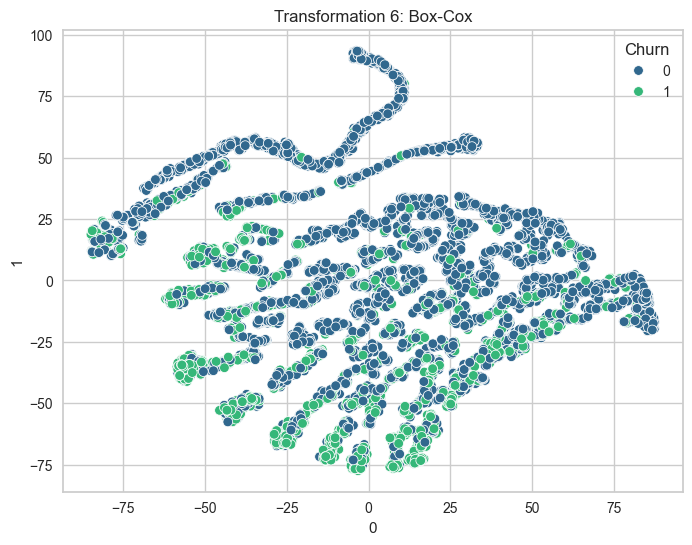

In [57]:
for i, df_ in enumerate([df_log, df_reciprocal, df_sqrt, df_sq, df_cbrt, df_boxcox]):
    features = df_.drop(columns=["Churn"])
    # kmeans = KMeans(n_clusters=4, n_init=10, init='k-means++')
    # kmeans.fit(features)
    # labels = kmeans.labels_
    tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(features))
    
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=tsne, x=0, y=1, hue=y, palette="viridis")
    plt.title(f'Transformation {i + 1}: {["Log", "Reciprocal", "Sqrt", "Square", "Cbrt", "Box-Cox"][i]}')
    plt.show()

**Note**
- Some transformation techniques, for handling right skewed column, are with similar results which made the two classes more sepreable than before.
- But I will use Log or Sqrt Transformation because i have noticed that thier results are the better. 
- I can select Log.

In [59]:
df_transformed = df_log.copy()
X_new = df_transformed.drop(columns=["Churn"])

25503.16668727922


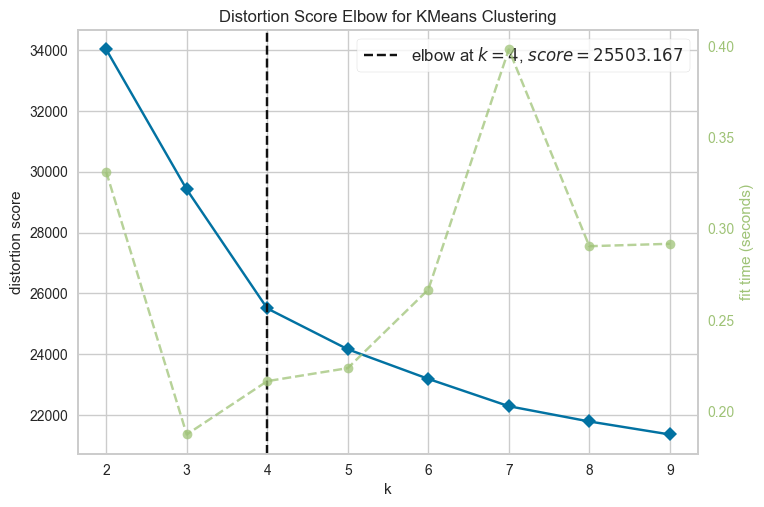

0.25164487381732636


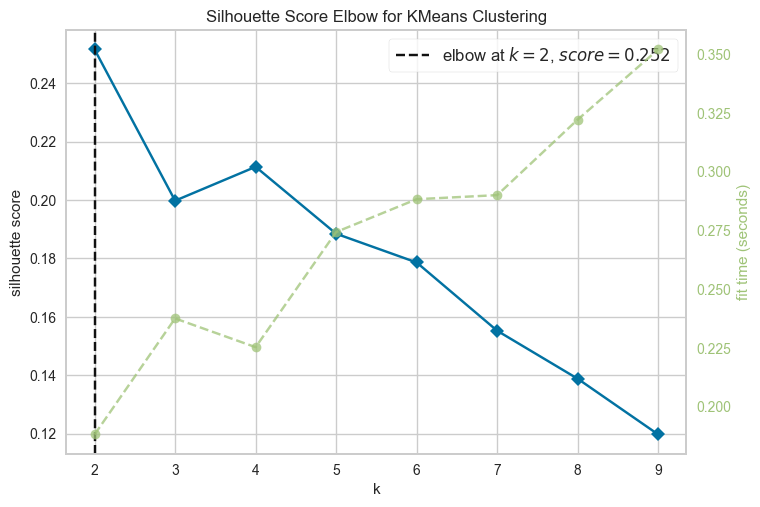

In [60]:
metrics = ['distortion', 'silhouette']
for metric in metrics:
    km = KMeans(random_state=0, n_init=10)
    visualizer = KElbowVisualizer(km, k=(2,10), metric=metric)
    visualizer.fit(X_new)
    print(visualizer.elbow_score_)
    visualizer.show() 

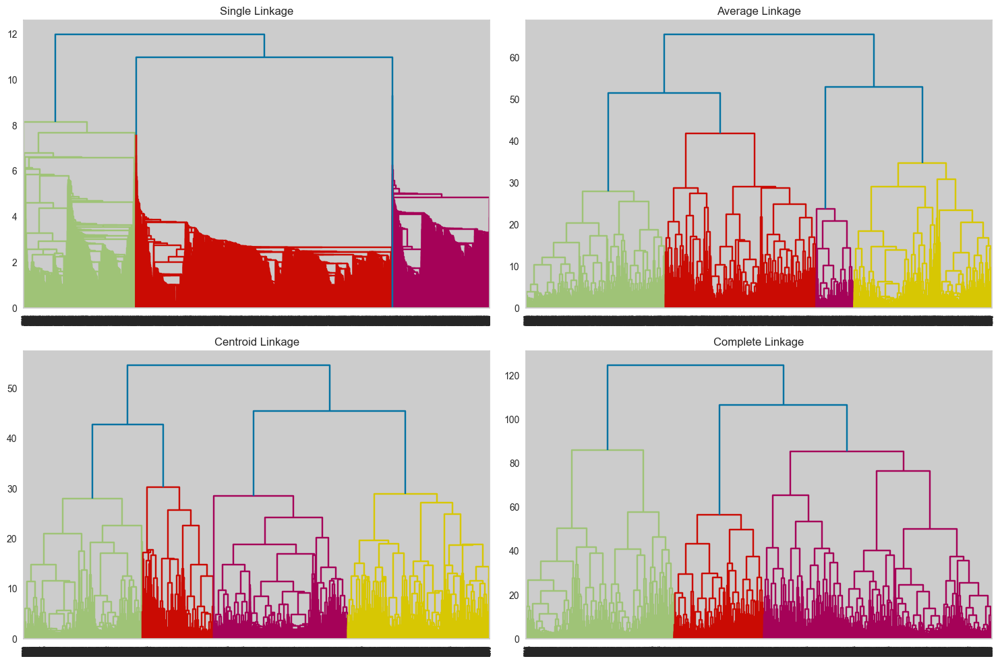

In [61]:
methods = ['single', 'average', 'centroid', 'complete']


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, method in enumerate(methods):
    plt.sca(axes[i])
    plt.title(f"{method.capitalize()} Linkage")
    dend = shc.dendrogram(shc.linkage(df, method=method, metric='euclidean'))

plt.tight_layout()
plt.show()

In [71]:
kmeans = KMeans(n_clusters=2, n_init=10).fit(X_new)

In [72]:
silhouette_score(X_new, labels)

0.19980746934246219

<Axes: xlabel='0', ylabel='1'>

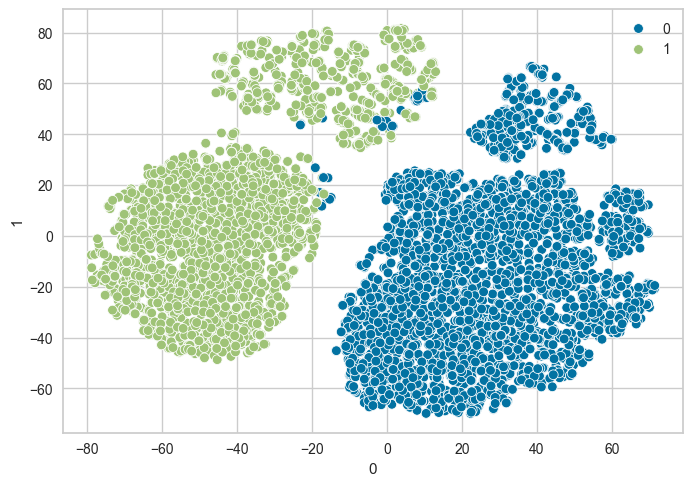

In [73]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X_new))
sns.scatterplot(df_tsne, x=0, y=1, hue=kmeans.labels_)

**Note**
- Although silhouette_score was more better before the transformation (0.46 -> 0.14). But It doesn't mean that there is a problem in transformation.
- Maybe the problem is because of KMeans not the transformation, So i should try the following two solutions:
    - Hyperparameter Tuning.
    - Other Clustering Algorithms.

#### **Hyperparameter Tuning**

In [74]:
def objective(trial):
    n_init = trial.suggest_int('n_init', 10, 100)
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    init = trial.suggest_categorical('init', ['k-means++', 'random'])


    model = KMeans(n_clusters=2, init=init, max_iter=max_iter, random_state=42, n_init=n_init)
    model.fit(X_new)
    labels = model.labels_
    

    score = silhouette_score(X_new, labels)
    return - score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {-study.best_value}")

[I 2024-09-22 01:59:44,182] A new study created in memory with name: no-name-71314cfa-2f01-414a-8fe8-de2684b8a05d
[I 2024-09-22 01:59:45,727] Trial 0 finished with value: -0.25164487381732636 and parameters: {'n_init': 43, 'max_iter': 870, 'init': 'k-means++'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:47,006] Trial 1 finished with value: -0.25164487381732636 and parameters: {'n_init': 21, 'max_iter': 573, 'init': 'k-means++'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:48,938] Trial 2 finished with value: -0.25164487381732636 and parameters: {'n_init': 62, 'max_iter': 172, 'init': 'random'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:52,218] Trial 3 finished with value: -0.25164487381732636 and parameters: {'n_init': 92, 'max_iter': 917, 'init': 'random'}. Best is trial 0 with value: -0.25164487381732636.
[I 2024-09-22 01:59:54,859] Trial 4 finished with value: -0.25164487381732636 and parameters: {'n_in

Best Parameters: {'n_init': 43, 'max_iter': 870, 'init': 'k-means++'}
Best Score: 0.25164487381732636


#### **KMeans (Final Results)**

In [167]:
kmeans = KMeans(n_clusters=2, n_init=43, max_iter=870, init='k-means++')
kmeans.fit(X_new)
kmeans_labels = kmeans.labels_
silhouette_score(X_new, kmeans_labels)

0.25164487381732636

<Axes: xlabel='0', ylabel='1'>

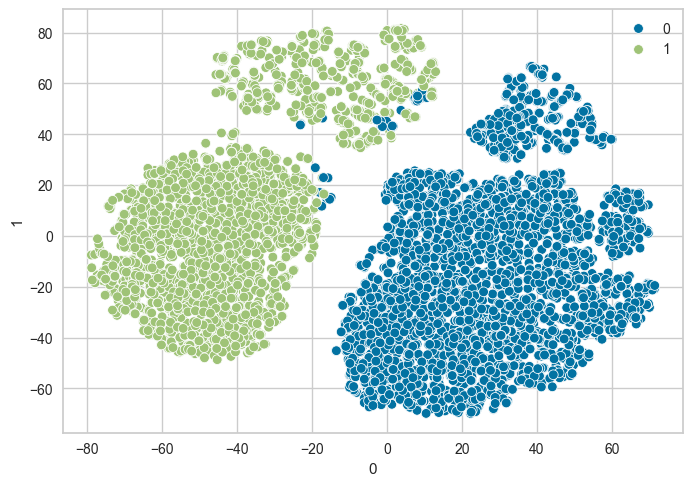

In [168]:
sns.scatterplot(df_tsne, x=0, y=1, hue=kmeans_labels)

**Note**
- I will try another algorithms that maybe more powerful than Kmeans.

### **2. Hierarchial Clustering**

In [77]:
hierarch = AgglomerativeClustering(n_clusters=2).fit(X_new)

In [78]:
silhouette_score(X_new, hierarch.labels_)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

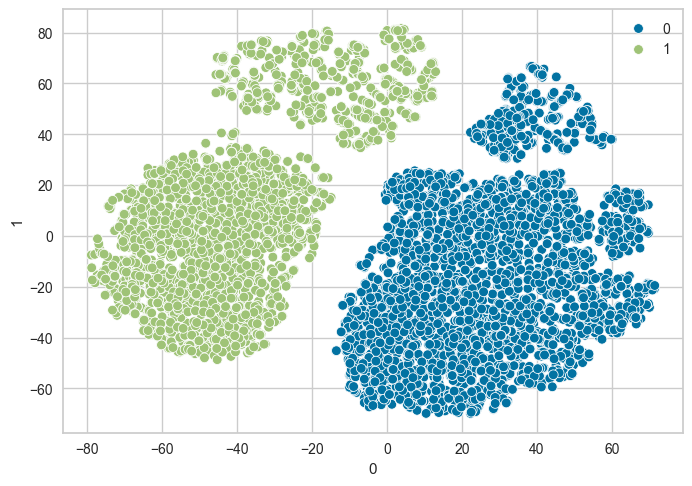

In [79]:
sns.scatterplot(df_tsne, x=0, y=1, hue=hierarch.labels_)

#### **Hyperparameter Tuning**

In [80]:
def objective(trial):

    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'cosine'])
    linkage = trial.suggest_categorical('linkage', ['ward', 'complete', 'average', 'single'])
    
    if linkage == 'ward' and metric != 'euclidean':
        return float('inf')

    model = AgglomerativeClustering(n_clusters=2, metric=metric, linkage=linkage)

    model.fit(X_new)

    score = silhouette_score(X_new, model.labels_)
    return - score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {- study.best_value}")

[I 2024-09-22 02:02:06,514] A new study created in memory with name: no-name-45137524-2e95-439c-bcae-b4f193f2d4d1
[I 2024-09-22 02:02:06,518] Trial 0 finished with value: inf and parameters: {'metric': 'cosine', 'linkage': 'ward'}. Best is trial 0 with value: inf.
[I 2024-09-22 02:02:09,106] Trial 1 finished with value: -0.2509377701249395 and parameters: {'metric': 'euclidean', 'linkage': 'ward'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:02:11,921] Trial 2 finished with value: -0.1760847128691377 and parameters: {'metric': 'cosine', 'linkage': 'average'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:02:14,404] Trial 3 finished with value: -0.1386682187485549 and parameters: {'metric': 'manhattan', 'linkage': 'complete'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:02:16,888] Trial 4 finished with value: -0.11204699217894404 and parameters: {'metric': 'cosine', 'linkage': 'complete'}. Best is trial 1 with value: -0.250

Best Parameters: {'metric': 'euclidean', 'linkage': 'ward'}
Best Score: 0.2509377701249395


#### **Hierarchial Clustering (Final Results)**

In [84]:
hierarch = AgglomerativeClustering(n_clusters=2, linkage='ward', metric='euclidean').fit(X_new)

In [85]:
silhouette_score(X_new, hierarch.labels_)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

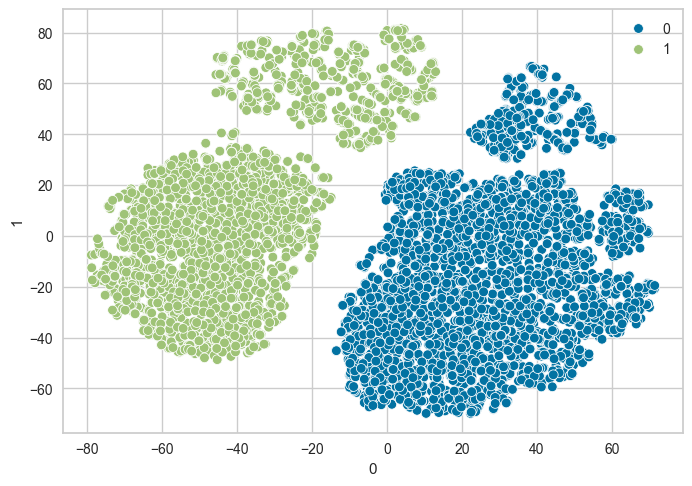

In [86]:
sns.scatterplot(df_tsne, x=0, y=1, hue=hierarch.labels_)

**Note**
- It's better than kmeans result, but still i will try another algorithms.

### **3. DBSCAN**

In [87]:
dbscan = DBSCAN(eps=0.5, min_samples=5).fit(X_new)

In [88]:
silhouette_score(X_new, dbscan.labels_)

-0.28066810133399167

<Axes: xlabel='0', ylabel='1'>

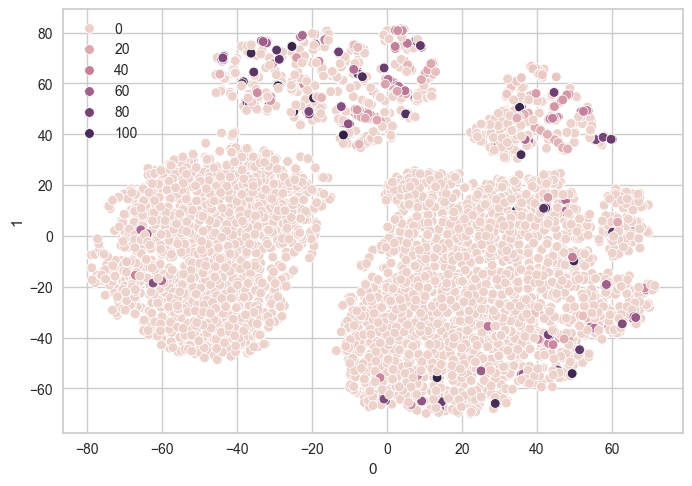

In [89]:
sns.scatterplot(df_tsne, x=0, y=1, hue=dbscan.labels_)

#### **Hyperparameter Tuning**

1. Choose min_samples:
    - A good starting point is using min_samples = D + 1, where D is the number of features (dimensions) in your dataset.
    - For datasets with noise or with some noise tolerance, increasing min_samples can help reduce noise sensitivity.

2. Choosing eps:
    - One common method for selecting eps is the k-distance graph:
        - Calculate the distance to the k-th nearest neighbor (usually k = min_samples - 1) for each point.
        - Plot the sorted k-distances.
        - Find the "elbow" or point of maximum curvature in this plot, which indicates the appropriate eps.

3. Visualize Clustering:
    - For lower-dimensional datasets, visually inspect the clusters formed by different eps values.
    - For higher-dimensional data, use dimensionality reduction techniques like PCA or t-SNE to visualize the clusters.


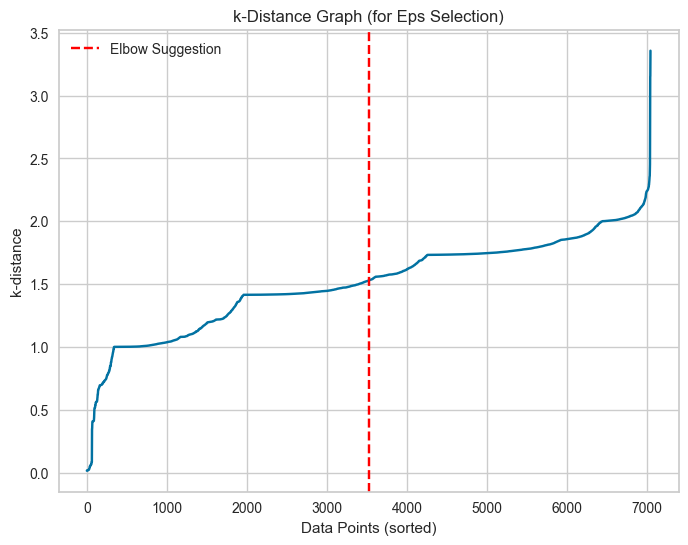

In [90]:
min_samples = 23
nbrs = NearestNeighbors(n_neighbors=min_samples).fit(X_new)
distances, indices = nbrs.kneighbors(X_new)

k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8, 6))
plt.plot(k_distances)
plt.axvline(x=len(k_distances) // 2, color='red', linestyle='--', label="Elbow Suggestion")
plt.title('k-Distance Graph (for Eps Selection)')
plt.xlabel('Data Points (sorted)')
plt.ylabel('k-distance')
plt.grid(True)
plt.legend()
plt.show()

#### **DBSCAN (Final Results)**

In [134]:
dbscan = DBSCAN(eps=1.87, min_samples=min_samples).fit(X_new)

In [135]:
silhouette_score(X_new, dbscan.labels_)

0.18381633350855703

In [136]:
## Removing the outliers to calculate the score
non_noise_mask = dbscan.labels_ != -1
non_noise_points = X_new[non_noise_mask]
non_noise_labels = dbscan.labels_[non_noise_mask]

silhouette_score(non_noise_points, non_noise_labels)

0.25290350103930115

In [137]:
from collections import Counter

a = dict(Counter(dbscan.labels_))
a

{0: 3858, 1: 3135, -1: 50}

<Axes: xlabel='0', ylabel='1'>

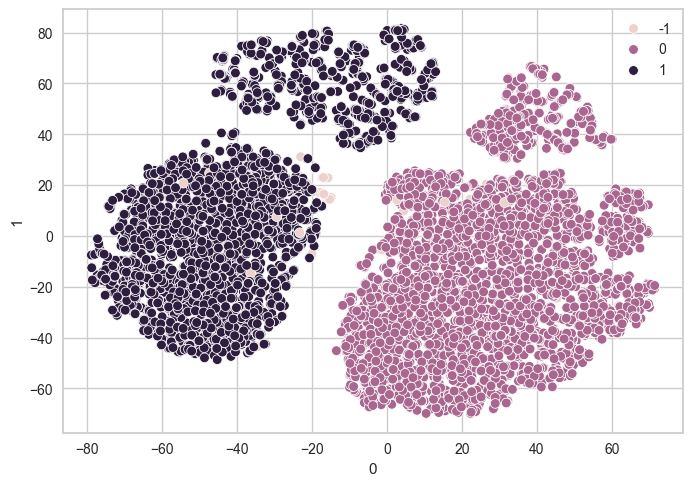

In [138]:
sns.scatterplot(df_tsne, x=0, y=1, hue=dbscan.labels_)

**Note**
- It's the best eps (1.87) and min_points with me untill now but there are some of outliers (50).
- For sure, I will try another algorithms.

### **4. GaussianMixture (GMM)**

In [139]:
gm = GaussianMixture(init_params='kmeans', n_components=2, random_state=42)
labels = gm.fit_predict(X_new)

In [140]:
silhouette_score(X_new, labels)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

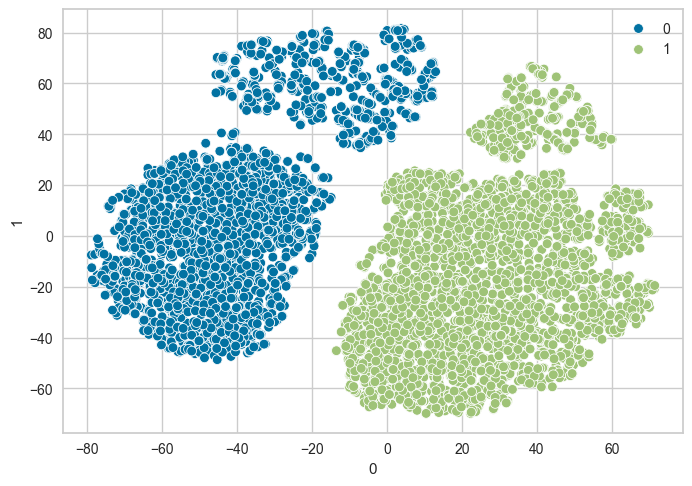

In [141]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

**Note**
- Its result is similar to Hierarchial Clustering
- It sepreted the data perfectly but I will apply some of hyperparamter tuning if there is further enhancement and specially for future points(Customers).

In [142]:
def objective(trial):
    covariance_type = trial.suggest_categorical('covariance_type', ['full', 'tied', 'diag', 'spherical'])
    init_params = trial.suggest_categorical('init_params', ['kmeans'])

    gmm = GaussianMixture(n_components=2, covariance_type=covariance_type, init_params=init_params, random_state=42)
    labels = gmm.fit_predict(X_new)

    try:
        score = silhouette_score(X_new, labels)
    except ValueError:
        score = 1.0
    
    return -score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {-study.best_value}")

[I 2024-09-22 02:23:39,196] A new study created in memory with name: no-name-5ef50582-9121-4913-81ec-90e1f7964db0
[I 2024-09-22 02:23:40,368] Trial 0 finished with value: -0.2515162416315771 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.2515162416315771.
[I 2024-09-22 02:23:41,576] Trial 1 finished with value: -0.2509377701249395 and parameters: {'covariance_type': 'diag', 'init_params': 'kmeans'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:23:42,872] Trial 2 finished with value: -0.2515162416315771 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:23:44,073] Trial 3 finished with value: -0.2509377701249395 and parameters: {'covariance_type': 'full', 'init_params': 'kmeans'}. Best is trial 1 with value: -0.2509377701249395.
[I 2024-09-22 02:23:45,351] Trial 4 finished with value: -0.2515162416315771 and parameters:

Best Parameters: {'covariance_type': 'diag', 'init_params': 'kmeans'}
Best Score: 0.2509377701249395


#### **Gaussian Mixture (Final Results)**

In [143]:
gm = GaussianMixture(init_params='kmeans', n_components=2, random_state=42, covariance_type='diag')
gm_labels = gm.fit_predict(X_new)

In [144]:
silhouette_score(X_new, labels)

0.2509377701249395

<Axes: xlabel='0', ylabel='1'>

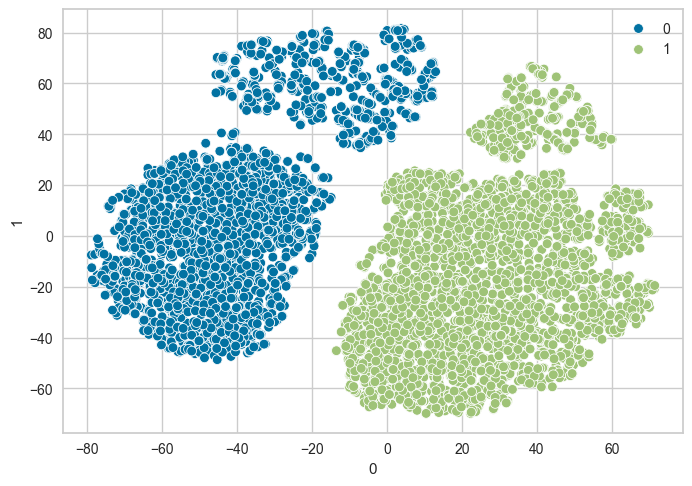

In [145]:
sns.scatterplot(df_tsne, x=0, y=1, hue=gm_labels)

**Note**
- GMM Result is somewhat similar to the result of the Hierarchial Clustering.
- I will search for more algorithms.

### **5. Isolation Forest**

In [146]:
irf = IsolationForest(random_state=0)
labels = irf.fit_predict(X_new)

<Axes: xlabel='0', ylabel='1'>

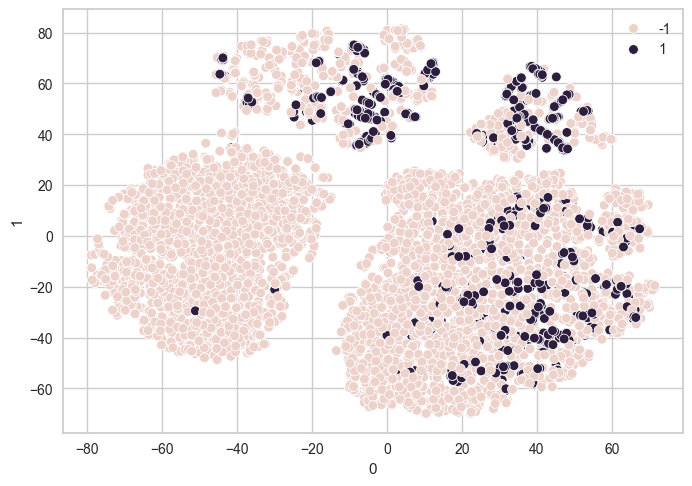

In [147]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

In [163]:
def objective(trial):

    n_estimators = trial.suggest_int('n_estimators', 50, 500)
    max_samples = trial.suggest_int('max_samples', 50, X_new.shape[0])
    max_features = trial.suggest_int('max_features', 1, X_new.shape[1])
    
    iso_forest = IsolationForest(n_estimators=n_estimators, max_samples=max_samples, max_features=max_features, random_state=42)
    labels = iso_forest.fit_predict(X_new)
    
    try:
        silhouette_avg = silhouette_score(X_new, labels)
    except ValueError:
        silhouette_avg = -1.0

    return silhouette_avg

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {study.best_value}")

[I 2024-09-22 02:31:04,621] A new study created in memory with name: no-name-7d401034-fd63-43e8-870e-1f28349e16c9
[I 2024-09-22 02:31:06,360] Trial 0 finished with value: 0.01777392606106779 and parameters: {'n_estimators': 164, 'max_samples': 3560, 'max_features': 5}. Best is trial 0 with value: 0.01777392606106779.
[I 2024-09-22 02:31:10,160] Trial 1 finished with value: 0.03784824653601768 and parameters: {'n_estimators': 311, 'max_samples': 6932, 'max_features': 20}. Best is trial 1 with value: 0.03784824653601768.
[I 2024-09-22 02:31:12,033] Trial 2 finished with value: 0.03338580427473701 and parameters: {'n_estimators': 221, 'max_samples': 1053, 'max_features': 12}. Best is trial 1 with value: 0.03784824653601768.
[I 2024-09-22 02:31:16,516] Trial 3 finished with value: 0.036038981412716026 and parameters: {'n_estimators': 451, 'max_samples': 5452, 'max_features': 18}. Best is trial 1 with value: 0.03784824653601768.
[I 2024-09-22 02:31:18,151] Trial 4 finished with value: 0.005

Best Parameters: {'n_estimators': 51, 'max_samples': 3592, 'max_features': 20}
Best Score: 0.043377815667086414


#### **Isolation Forest (Final Results)**

In [164]:
irf = IsolationForest(n_estimators=51, max_samples=3592, max_features=20, random_state=0)
labels = irf.fit_predict(X_new)

<Axes: xlabel='0', ylabel='1'>

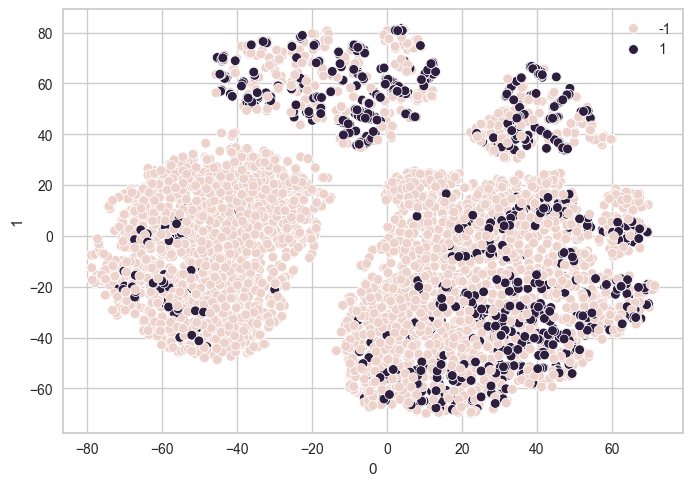

In [165]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

**Note**
- Its result is still approximately similar as before, And all previous algorithms are better.

### **Final Results**
- GMM and Hierarchial Clustering are the best ones, then DBSCAN and KMeans.
- So I will use GMM to extract the insights and the information of each cluster.
- To do so (extract the insights), I will plot the percentage of customers in each cluster for each feature.
- So, for example, If the percentage of customers of specific feature is high in cluster and low in the other. It means that this feature describe the cluster more clearly, So easily I can depend on this feature to differenciate the current or new customer belongs to which cluster.

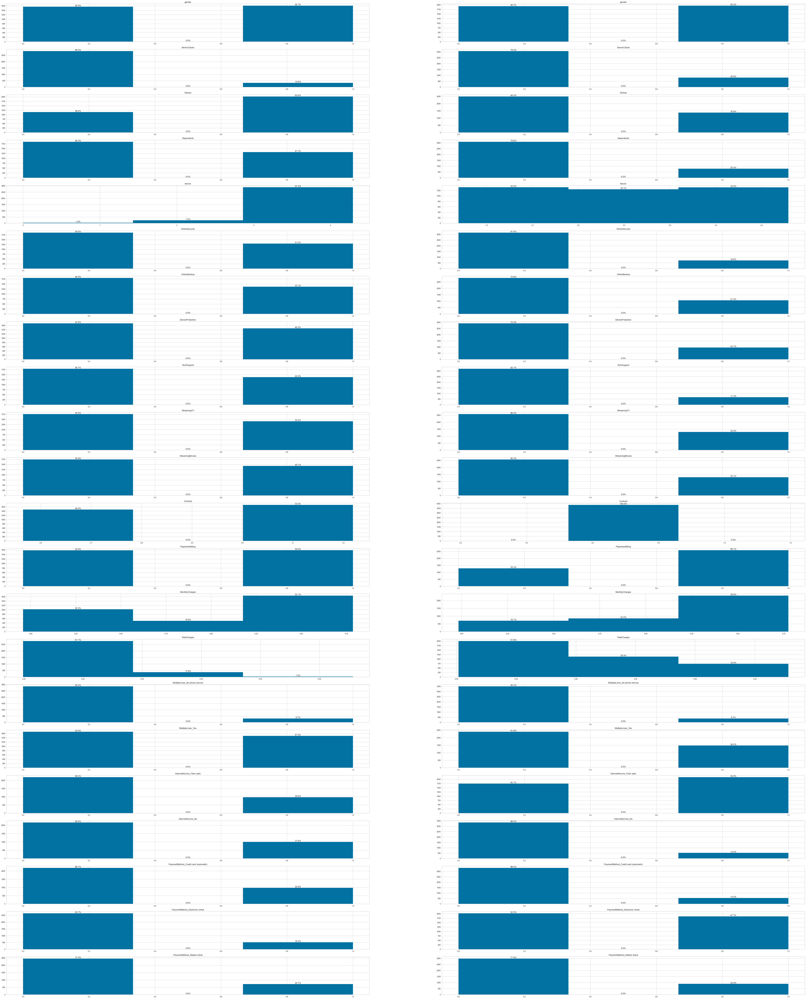

In [166]:
num_features = len(X.columns)
fig, ax = plt.subplots(num_features, 2, figsize=(80, 100))

for column in X.columns:    
    feature_index = X.columns.get_loc(column)
    
    for label in range(2):    
        ax[feature_index, label].hist(df_log[column][np.where(gm_labels == label)[0]], bins=3)
        
        counts, bins = np.histogram(df_log[column][np.where(gm_labels == label)[0]], bins=3)
        percentages = [(count / len(df_log[column][np.where(gm_labels == label)[0]])) * 100 for count in counts]

        for i in range(len(bins) - 1):
            bin_center = (bins[i] + bins[i + 1]) / 2
            ax[feature_index, label].text(bin_center, counts[i], f'{percentages[i]:.1f}%', ha='center', va='bottom')

        ax[feature_index, label].title.set_text(column)

### **Our Insights**

**First Cluster**

- First Cluster includes customers with high tenure.
- First Cluster uses almost all services provided by telecom company.
- First Cluster has a high percentage of customers that use paperless billing.
- First Cluster includes customers with very high amount charged monthly.
- First Cluster uses multiple lines.
- First Cluster includes many customers 2-year contract.
- First Cluster use automatic check in payment more.

**Second Cluster**
- Second Cluster includes customers with low tenure compared to first cluster.
- Second Cluster uses the services slightly.
- Second Cluster has a low percentage of customers that use paperless billing.
- Second Cluster includes customers with low or moderate amount charged monthly.
- Second Cluster doesn't use multiple lines.
- Second Cluster nearly doesn't include customers 2-year contract.
- Second Cluster use electronic check more.

### **From Previous Insights**

- It's expected that the second cluster is the likely to churn cluster and the first cluster will not churn, Because:
    - First Cluster
        - high tenure.
        - charges monthly with a high amount and have multiple lines that it means they are satisfied about the provided telecom service.
        - uses all company services that it means they are very engaged and comfortable with using the system.
        - adopt the 2-year contract.

    - Second Cluster
        - low tenure
        - doesn't charge monthly with high amounts.
        - doesn't use the multiple lines.
        - doesn't adopt the long time contracts.

### **Solutions For Retention**

1. Make discounts for first cluster because they charge monthly with high amounts.
2. Make gifts (free sevices for period) for first cluster in year anniversery to strength their belonging and loyalty with the company.
2. Make an electronic adversements and offers for customers in second cluster.
3. Make offers for second cluster customers on using or connecting addition or new phone lines.

## **Another Clustering Approach**
- I will use transformed data via Reciprocal Transformation to make the clustering because the resultant clusters from this transformation is also seperable.

In [172]:
df_transformed = df_reciprocal.copy()
X_reciprocal = df_transformed.drop(columns=["Churn"])

552685.5772542041


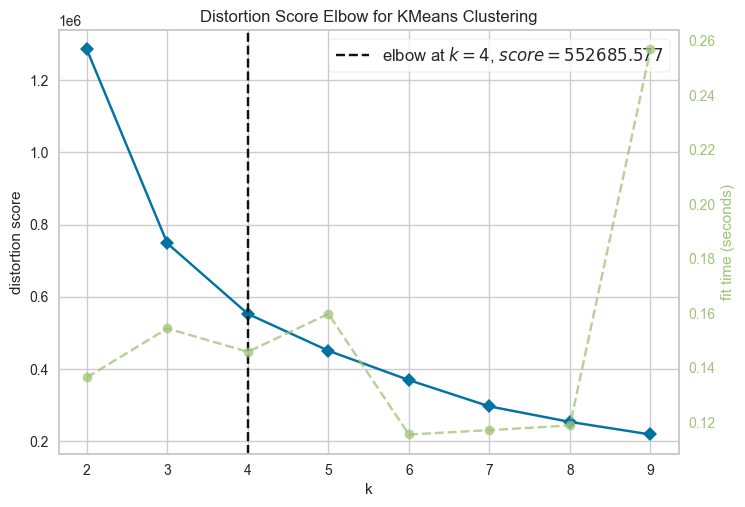

0.6135716059853917


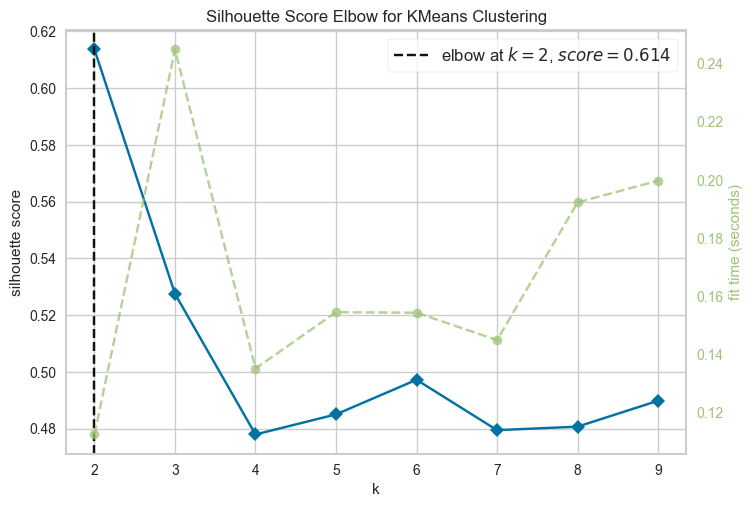

In [170]:
metrics = ['distortion', 'silhouette']
for metric in metrics:
    km = KMeans(random_state=0, n_init=10)
    visualizer = KElbowVisualizer(km, k=(2,10), metric=metric)
    visualizer.fit(X_reciprocal)
    print(visualizer.elbow_score_)
    visualizer.show() 

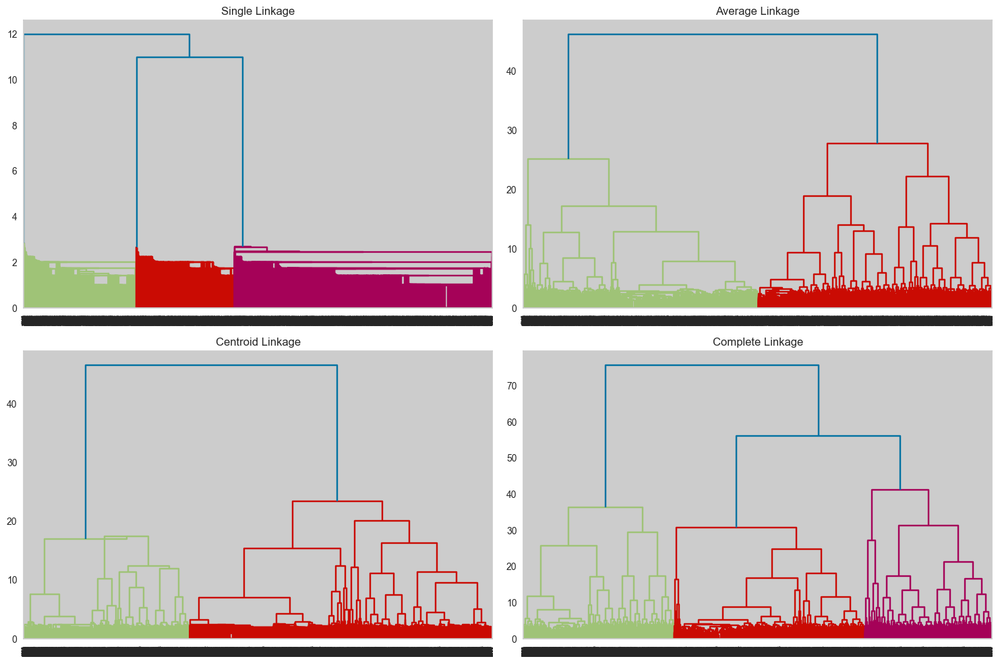

In [171]:
methods = ['single', 'average', 'centroid', 'complete']


fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, method in enumerate(methods):
    plt.sca(axes[i])
    plt.title(f"{method.capitalize()} Linkage")
    dend = shc.dendrogram(shc.linkage(X_reciprocal, method=method, metric='euclidean'))

plt.tight_layout()
plt.show()

<Axes: xlabel='0', ylabel='1'>

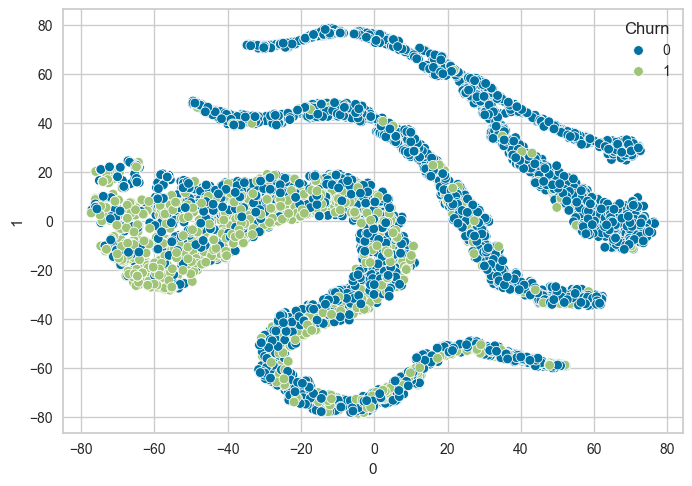

In [173]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X_reciprocal))
sns.scatterplot(df_tsne, x=0, y=1, hue=y)

In [198]:
df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(X_reciprocal))

**Note**
- From previous techniques:
   - Distortion (4) and Silhouette (2): **Average (3)**
   - Complete Dendogram
   - T-SNE
- I will select **(3)** as a number of cluster.

**Note**

- From the shape and structure of clusters, I think DBSCAN will be the model with the best clustering result.
- But i will try others in addition to DBSCAN.

### **1. BSCAN**

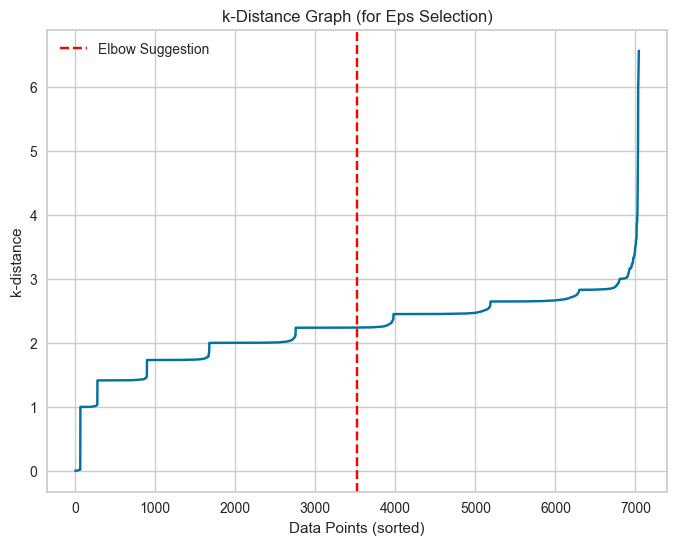

In [237]:
min_samples = 22
nbrs = NearestNeighbors(n_neighbors=min_samples).fit(X_reciprocal)
distances, indices = nbrs.kneighbors(X_reciprocal)

k_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8, 6))
plt.plot(k_distances)
plt.axvline(x=len(k_distances) // 2, color='red', linestyle='--', label="Elbow Suggestion")
plt.title('k-Distance Graph (for Eps Selection)')
plt.xlabel('Data Points (sorted)')
plt.ylabel('k-distance')
plt.grid(True)
plt.legend()
plt.show()

In [327]:
dbscan = DBSCAN(eps=7, min_samples=23).fit(X_reciprocal)

In [328]:
from collections import Counter

a = dict(Counter(dbscan.labels_))
a

{0: 3875, 1: 1473, 2: 1695}

<Axes: xlabel='0', ylabel='1'>

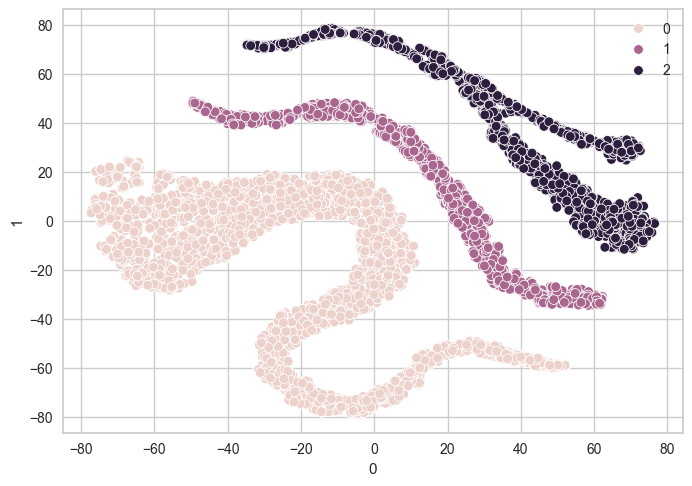

In [329]:
sns.scatterplot(df_tsne, x=0, y=1, hue=dbscan.labels_)

#### **Important Note**
- I tried different eps and found that eps = [4.2 : 11] seperates the datato three clusters perfectly without any outliers
- So, I will choose eps = 7 because it's the middle of range.

### **2. Hierarchial Clustering**

In [248]:
def objective(trial):

    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'cosine'])
    linkage = trial.suggest_categorical('linkage', ['ward', 'complete', 'average', 'single'])
    
    if linkage == 'ward' and metric != 'euclidean':
        return float('inf')

    model = AgglomerativeClustering(n_clusters=3, metric=metric, linkage=linkage)

    model.fit(X_reciprocal)

    score = silhouette_score(X_reciprocal, model.labels_)
    return - score

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {- study.best_value}")

[I 2024-09-22 03:51:49,613] A new study created in memory with name: no-name-2e421b90-5753-42ca-94c6-1866ba45b68d
[I 2024-09-22 03:51:53,117] Trial 0 finished with value: -0.06570978121203487 and parameters: {'metric': 'cosine', 'linkage': 'average'}. Best is trial 0 with value: -0.06570978121203487.
[I 2024-09-22 03:51:55,897] Trial 1 finished with value: -0.5220443646974556 and parameters: {'metric': 'euclidean', 'linkage': 'complete'}. Best is trial 1 with value: -0.5220443646974556.
[I 2024-09-22 03:51:55,901] Trial 2 finished with value: inf and parameters: {'metric': 'cosine', 'linkage': 'ward'}. Best is trial 1 with value: -0.5220443646974556.
[I 2024-09-22 03:51:55,903] Trial 3 finished with value: inf and parameters: {'metric': 'cosine', 'linkage': 'ward'}. Best is trial 1 with value: -0.5220443646974556.
[I 2024-09-22 03:51:59,020] Trial 4 finished with value: -0.06456884579784575 and parameters: {'metric': 'cosine', 'linkage': 'complete'}. Best is trial 1 with value: -0.5220

Best Parameters: {'metric': 'euclidean', 'linkage': 'complete'}
Best Score: 0.5220443646974556


In [330]:
hierarch = AgglomerativeClustering(n_clusters=3, linkage='complete', metric='euclidean').fit(X_reciprocal)

<Axes: xlabel='0', ylabel='1'>

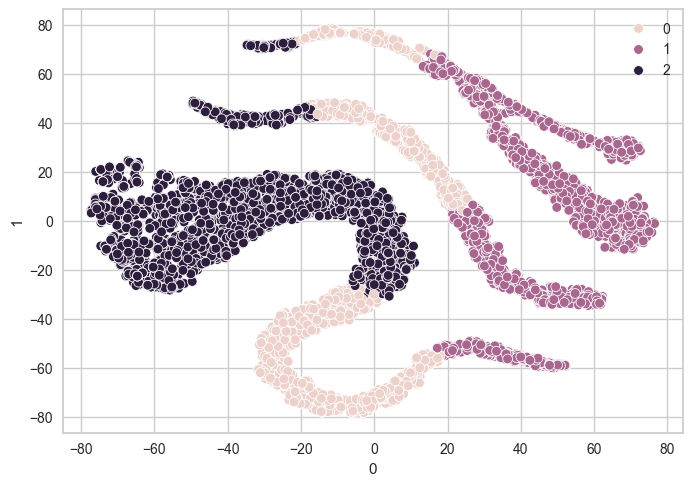

In [331]:
sns.scatterplot(df_tsne, x=0, y=1, hue=hierarch.labels_)

### **3. GMM**

In [194]:
def objective(trial):
    covariance_type = trial.suggest_categorical('covariance_type', ['full', 'tied', 'diag', 'spherical'])
    init_params = trial.suggest_categorical('init_params', ['kmeans'])

    gmm = GaussianMixture(n_components=3, covariance_type=covariance_type, init_params=init_params, random_state=42)
    labels = gmm.fit_predict(X_reciprocal)

    try:
        score = silhouette_score(X_reciprocal, labels)
    except ValueError:
        score = 1.0
    
    return -score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

print(f"Best Parameters: {study.best_params}")
print(f"Best Score: {-study.best_value}")

[I 2024-09-22 03:28:54,697] A new study created in memory with name: no-name-37f8225b-2c91-434f-88f5-3166c8258a55
[I 2024-09-22 03:28:55,741] Trial 0 finished with value: -0.47017123471654415 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.47017123471654415.
[I 2024-09-22 03:28:56,846] Trial 1 finished with value: -0.47017123471654415 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.47017123471654415.
[I 2024-09-22 03:28:57,902] Trial 2 finished with value: -0.47017123471654415 and parameters: {'covariance_type': 'spherical', 'init_params': 'kmeans'}. Best is trial 0 with value: -0.47017123471654415.
[I 2024-09-22 03:28:59,700] Trial 3 finished with value: -0.4414886398838573 and parameters: {'covariance_type': 'full', 'init_params': 'kmeans'}. Best is trial 3 with value: -0.4414886398838573.
[I 2024-09-22 03:29:01,295] Trial 4 finished with value: -0.4414886398838573 and 

Best Parameters: {'covariance_type': 'diag', 'init_params': 'kmeans'}
Best Score: 0.09783396967149331


In [333]:
gm = GaussianMixture(init_params='kmeans', n_components=3, random_state=42, covariance_type='diag')
labels = gm.fit_predict(X_reciprocal)

<Axes: xlabel='0', ylabel='1'>

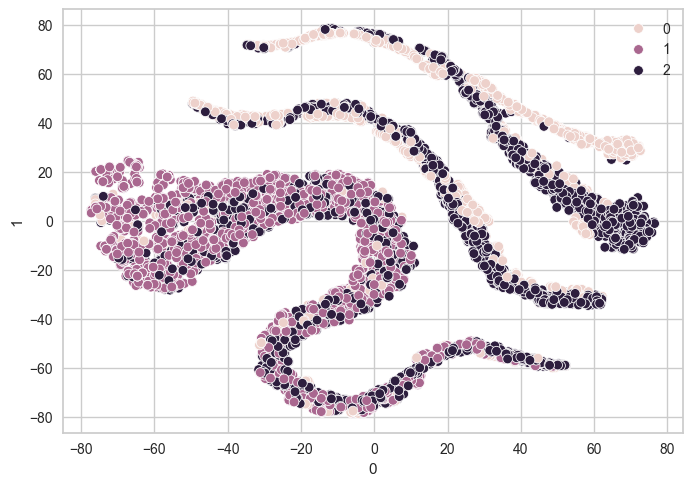

In [334]:
sns.scatterplot(df_tsne, x=0, y=1, hue=labels)

### **Note**
- As I expected **DBSCAN** made the **Best Result**.

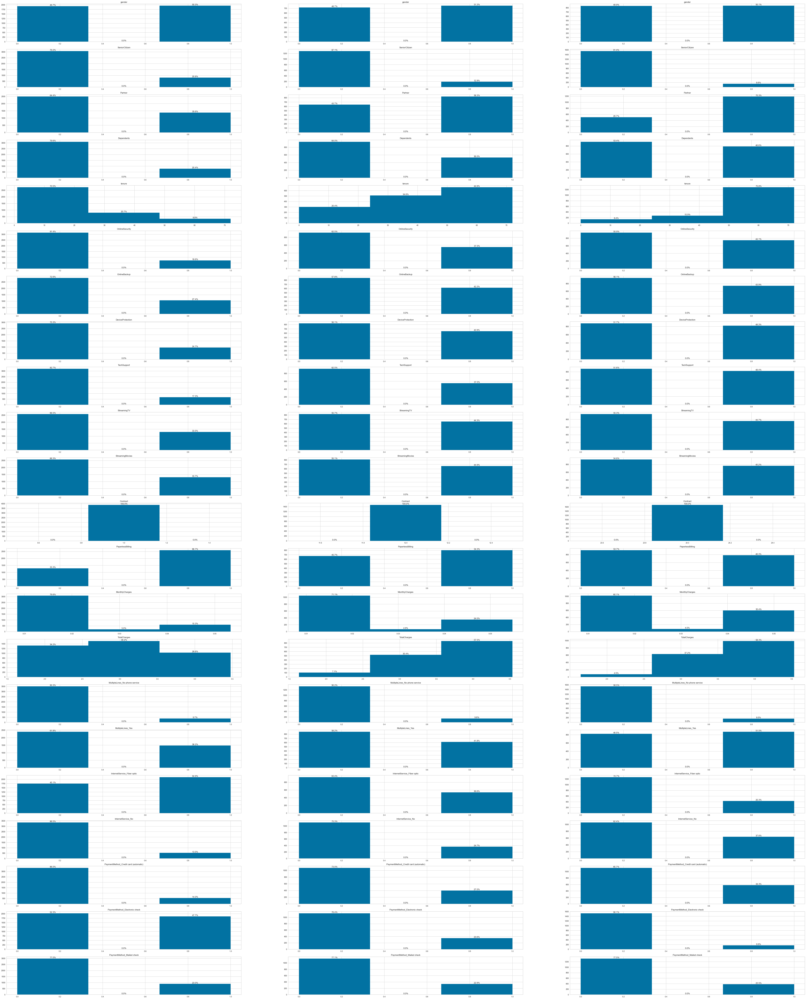

In [336]:
num_features = len(X.columns)
fig, ax = plt.subplots(num_features, 3, figsize=(80, 100))

for column in X.columns:    
    feature_index = X.columns.get_loc(column)
    
    for label in range(3):    
        ax[feature_index, label].hist(df_reciprocal[column][np.where(dbscan.labels_ == label)[0]], bins=3)
        
        counts, bins = np.histogram(df_reciprocal[column][np.where(dbscan.labels_ == label)[0]], bins=3)
        percentages = [(count / len(df_reciprocal[column][np.where(dbscan.labels_ == label)[0]])) * 100 for count in counts]

        for i in range(len(bins) - 1):
            bin_center = (bins[i] + bins[i + 1]) / 2
            ax[feature_index, label].text(bin_center, counts[i], f'{percentages[i]:.1f}%', ha='center', va='bottom')

        ax[feature_index, label].title.set_text(column)

### **Our Insights**

**First Cluster**
- First Cluster includes customers with **lowest tenure** (only **8%** of customers in this cluster spent (50 : 70) months with the Telecom Company).
- First Cluster includes customers with **month-to-month contract**.
- First Cluster use the services rarely, almost non-existent.
- First Cluster has a high percentage of customers that use paperless billing.
- First Cluster includes customers with low amount charged monthly.
- First Cluster doesn't (lowest) use multiple lines.
- First Cluster includes customers with lowest percentage of partners and dependents
- First Cluster uses highly the fiber optic internet service.
- First Cluster use electronic check more.

**Second Cluster**
- Second Cluster includes customers with **moderate tenure** (**45%** of customers in this cluster spent (50 : 70) months with the Telecom Company).
- Second Cluster include customers with **1-year contract**.
- Second Cluster uses the services more than first cluster.
- Second Cluster has a low percentage of customers that use paperless billing.
- Second Cluster includes customers with moderate amount charged monthly.
- Second Cluster uses (moderate) use multiple lines.
- Second Cluster includes customers with more higher percentage of partners and dependents

**Third Cluster**
- Third Cluster includes customers with **highest tenure** (**75%** of customers in this cluster spent (50 : 70) months with the Telecom Company).
- Third Cluster includes customers with **2-year contract**.
- Third Cluster customers use all services provided by telecom company.
- Third Cluster has a low percentage of customers that use paperless billing.
- Third Cluster includes customers with high amount charged monthly.
- Third Cluster uses (highest) multiple lines.
- Third Cluster includes a higher percentege of customers that don't use internet service compared to other clusters.
- Third Cluster use automatic check in payment more.
- Third Cluster includes customers with more higher percentage of partners and dependents.

### **From Previous Insights**
- It's expected that the **First Cluster** is more likely to **Churn** Because it:
    - has a low tenure.
    - doesn't charge monthly with high amounts.
    - adopts month-to-month contract.
    - charges monthly with a low amount and doesn't multiple lines that it means they are't satisfied, trusted or cared about the provided telecom service.
    - doesn't uses company services that it means they aren't engaged and comfortable with using the telecom company services or system.

## **<a id='con'>Conclusion</a>**

- I think The two clustering approaches (2 OR 3 Clusters) are valid and can be used by the business, But It's up to business if it prefers to deal with three clusters or deal with two.
- But in my opinion, I prefered more the 3 clusters, Because I think It clearly distinguished between customers.
- So I will adopt the second approach to provide novel insights.

### **Novel Insights**

##### **First Cluster: High Churn Risk**

   - **Key Characteristics:**
      - Lowest tenure, month-to-month contract, low service usage, low monthly charges, high usage of fiber optic internet, electronic check payment.

   - **Retention Strategies:**
      1. **Incentivize Contract Upgrade:**
         - Offer discounts or promotions to switch from month-to-month contracts to longer-term (e.g., 1-year) contracts. This could reduce churn by locking in customers for a longer period.
      2. **Usage Encouragement:**
         - Promote service packages that encourage engagement. You could offer limited-time free trials for premium services or special bundle offers.
      3. **Enhanced Customer Support:**
         - Provide dedicated customer service to assist customers in maximizing the value of their telecom services, helping to foster trust and engagement.
      4. **Rewards for Tenure:**
         - Offer loyalty programs that reward customers for staying with the company longer. For example, provide discounts on monthly charges or free services after 6 or 12 months.

   - **Upselling Opportunities:**
      1. **Service Bundling:**
         - Upsell services they are not currently using, such as adding multiple lines, digital subscriptions, or cloud services, by offering bundle discounts.
      2. **Upgrade Internet Packages:**
         - Since they use fiber optic internet, offer higher-speed plans with attractive discounts or additional features (e.g., priority customer service).
         

##### **Second Cluster: Moderate Tenure**

   - **Key Characteristics:**
      - Moderate tenure, 1-year contract, moderate service usage, low paperless billing usage, moderate monthly charges, moderate use of multiple lines, higher percentage of partners and dependents.

   - **Retention Strategies:**
      1. **Contract Extension Offers:**
         - Incentivize contract renewals by offering benefits for moving to a 2-year contract (e.g., price locks or free upgrades).
      2. **Family Plans & Group Discounts:**
         - Leverage the higher percentage of partners and dependents by offering family plans or discounts on adding more lines.
      3. **Paperless Billing Adoption:**
         - Encourage paperless billing by offering a small monthly discount for switching to this option, improving customer satisfaction while reducing operational costs.

   - **Upselling Opportunities:**
      1. **Service Usage Packages:**
         - Offer upselling opportunities for services they use moderately, such as data plans, entertainment bundles, or more comprehensive family packages.
      2. **Additional Lines and Features:**
         - Since they moderately use multiple lines, offer promotions for adding more lines or premium features (e.g., international calling, home security services).


##### **Third Cluster: High Loyalty**

   - **Key Characteristics:**
      - Highest tenure, 2-year contract, high service usage, low paperless billing, high monthly charges, high usage of multiple lines, higher percentage of customers without internet service, use of automatic check payment.

   - **Retention Strategies:**
      1. **Loyalty Programs:**
         - Reward these long-term customers with exclusive benefits, such as free upgrades, priority customer service, or discounts on premium services.
      2. **Paperless Billing Incentives:**
         - Similar to the second cluster, encourage the adoption of paperless billing through financial incentives, adding to customer convenience.
      3. **Customized Offers:**
         - Personalize offers based on their service usage to make them feel valued. For example, offer tailored packages for specific services they use most (e.g., TV bundles or home phone features).

   - **Upselling Opportunities:**
      1. **Cross-Sell Internet Services:**
         - Since a higher percentage of this cluster doesn't use internet services, offer attractive promotions or incentives to get them onboard with internet services.
      2. **Premium Plans:**
         - Given their willingness to pay higher amounts monthly, you can upsell premium services such as higher-tier internet speeds, enhanced security services, or entertainment packages.

I think these strategies can help reduce churn in the at-risk group, increase customer satisfaction in all groups, and open up new upselling opportunities for revenue growth.